# Event Analysis
## Contents
1. Introduction
1. Data Preparation
	1. Moonlit Whispers
	1. Shadows & Serenades
	1. Canvas of Dreams
	1. Dawn's Prelude
1. Exploratory Analysis
    1. Demographics
        1. Ethnicity
        1. Gender Identity
        1. Residence
        1. Age
        1. Post Code
        1. Section Summary
    1. Dimensions
        1. Captivation
        1. Concept
        1. Rigour
        1. Thought Provoking
        1. Relevance
        1. Distinctiveness
        1. Section Summary
    1. Intelligence
        1. Expectations
        1. Overall Experience
        1. Repeat Attendance
        1. Previous Attendance
        1. Section Summary
    1. Chapter Summary
1. Associations
    1. Intent to Attend a Similar Event in the Future given Previous Attendance
    1. Meeting Expectations given Previous Attendance
    1. Distinctiveness given Previous Attendance
1. Conclusion
    

## 1. Introduction
Four surveys were conducted for the events: 'Moonlit Whispers', 'Shadows & Serenades', 'Canvas of Dreams' and 'Dawn's Prelude'. This report intends to analyse survey responses for each event to allow for comparison.
The raw data is provided in separate csv files with the following attributes:

Table 1: Meta attributes

| Attribute        |      Description             | Value Type   | Value Categories |
|:--------------|:-----------------------------|:------:|:------:|
|user-id        | Unique user ID number                      | Numeric | NA |
|user        | Unique user name                  | Discrete | Various|
|survey-id   | Unique survey ID number            | Integer | NA |
|timestamp | Date and time survey was completed            | Time and Date | NA |
|survey   | Title of the Survey     | Discrete | 'Moonlit Whispers', 'Shadows & Serenades', 'Canvas of Dreams' and 'Dawn's Prelude' |
|respondent-category         | Respondent Category | Discrete | 'Public'|
|time-category |  Time Category         | NA | NA |

Table 2: Dimension attributes

| Attribute        |      Description             | Value Type   | 
|:--------------|:-----------------------------|:------:|
|Captivation   | Extent it was absorbing and held attention  | Numeric (0-1) | 
|Concept   | Extent it was an interesting idea | Numeric (0-1)  |
|Rigour | Extent it was well thought through and put together | Numeric (0-1)  |
|Thought Provoking   | Extent it was thought provoking| Numeric (0-1)  |
|Relevance         | Extent it had something to say about modern society | Numeric (0-1)  |
|Distinctiveness |  Extent it was different from things experienced before      | Numeric (0-1)  |

The attributes in Table 2 are assigned values ranging from 0 to 1. Higher values indicate that survey respondents more strongly associate the event with the attribute, while lower values suggest a weaker association.

Table 3: Demographic attributes

| Attribute        |      Description             | Value Type  | 
|:--------------|:-----------------------------|:------:|
|Age   | Age group | Discrete | 
|Gender identity   | Gender group | Discrete  |
|Ethnicity | Ethnic group | Discrete  |
|Ethnicity (other)    | Ethnicity if not included in drop down options | Discrete |
|Asian ethnicity   | Asian ethnic group | Discrete  |
|Asian ethnicity (other) |  Asian ethnicity if not included in drop down options    | Discrete  |
|Black ethnicity   | Black ethnic group | Discrete  |
|Black ethnicity (other) |  Black ethnicity if not included in drop down options    | Discrete  |
|Mixed ethnicity   | Mixed ethnic group | Discrete  |
|Mixed ethnicity (other) |  Mixed ethnicity if not included in drop down options    | Discrete  |
|White ethnicity   | White ethnic group | Discrete  |
|White ethnicity (other) |  White ethnicity if not included in drop down options    | Discrete  |
|Location | UK resident | Binary  |
|UK postcode |  Postcode of residence    | Discrete  |
|Country of Residence | If not UK, then country of residence | Discrete  |

Table 4: Intelligence attributes

| Attribute        |      Description             | Value Type | Value Categories |
|:--------------|:-----------------------------|:------:|:------:|
|Compare to expectations | How did the event compare to expectations | Discrete | 'Met', 'Exceeded', 'Somewhat exceeded', 'I had no expectations', 'Somewhat fell short', 'Fell short'|
|overall-experience  | Rating of experience overall | Discrete  |'Good', 'Excellent', 'Neutral', 'Poor'|
|Repeat attendance | Intention to attend a similar event in the future | Discrete  |'Yes', 'Maybe', 'No', 'Other (please specify)'|
|Repeat attendance (other) | Intention to attend a similar event in the future if not included in drop down options | Text || 
|Previous attendance  | Last time respondent attended an event by the same organisation | Discrete  |'6 < 12 months', '0 < 6 months', 'I have never attended before', 'Last 1 < 2 years', 'Last 2 < 3 years', 'More than 3 years ago'|

The attributes in Table 4 capture other factors which might influence the respondent's
opinions about their experience.

## 2. Data Preparation
Loading the four raw CSV revealed that they that they lacked the necessary structure to create a DataFrame suitable for analysis. Hence, some modifications were required for each CSV, each one undergoing the same procedure. Still, the CSV were clean in terms of responses because of the survey design.

Several aspects of the CSV were removed, including the hierarchical column structure, which is difficult to manipulate. Moreover, empty rows and columns containing only NaN values were removed (rows with at least one non-null value were retained), along with meta attributes such as user and timestamp, which were unnecessary for this analysis.

Finally, column names were made consistent.

### 2. A. Moonlit Whispers

In [1]:
import pandas as pd
from skimpy import clean_columns
# Loading
moonlit = pd.read_csv("moonlit.csv")
print("Moonlit Whispers Raw")
moonlit

Moonlit Whispers Raw


,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Meta,Unnamed: 6,Unnamed: 7,Dimension,Unnamed: 9,...,Unnamed: 29,Unnamed: 30,Unnamed: 31,Unnamed: 32,Intelligence,Unnamed: 34,Unnamed: 35,Unnamed: 36,Unnamed: 37,Unnamed: 38
0,user-id,survey-id,user,timestamp,survey,NaN,respondent-category,time-category,NaN,Captivation,...,Location,UK postcode,Country of residence,What is your country of residence (if not UK)?...,NaN,Compare to expectations,overall-experience,Repeat attendance,Would you attend a similar event in the future...,Previous attendance
1,NaN,NaN,NaN,NaN,NaN,NaN,Which category does the respondent belong to?,What is the time category of this survey?,NaN,It was absorbing and held my attention,...,Do you currently reside in the UK?,What is the postcode of your current residence?,What is your country of residence (if not UK)?,NaN,NaN,How did the event compare to your expectations?,How would you rate your experience overall?,Would you attend a similar event in the future?,NaN,When did you last attend an event by this orga...
2,NaN,NaN,NaN,NaN,NaN,NaN,shorttext,dropdown,NaN,slider,...,yesno,shorttext,dropdown,shorttext,NaN,dropdown,dropdown,dropdown,shorttext,dropdown
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5484876,35012,anonymous_5484876,2023-06-21 16:00:00 UTC+0000,Moonlit Whispers public survey,NaN,public,NaN,NaN,0.8,...,1,DE21 2LN,NaN,NaN,NaN,Met,Good,Yes,NaN,6 < 12 months
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
387,5485259,35012,anonymous_5485259,2023-06-23 16:00:00 UTC+0000,Moonlit Whispers public survey,NaN,public,NaN,NaN,1,...,1,SW7 5RR,NaN,NaN,NaN,Met,Good,Yes,NaN,I have never attended before
388,5485260,35012,anonymous_5485260,2023-06-23 16:00:00 UTC+0000,Moonlit Whispers public survey,NaN,public,NaN,NaN,0.95,...,1,Ex2 8er,NaN,NaN,NaN,Exceeded,Excellent,Yes,NaN,I have never attended before
389,5485261,35012,anonymous_5485261,2023-06-23 16:00:00 UTC+0000,Moonlit Whispers public survey,NaN,public,NaN,NaN,0.6,...,1,LS15,NaN,NaN,NaN,Fell short,Excellent,Yes,NaN,More than 3 years ago
390,5485262,35012,anonymous_5485262,2023-06-23 16:00:00 UTC+0000,Moonlit Whispers public survey,NaN,public,NaN,NaN,1,...,1,N16 8GL,NaN,NaN,NaN,Met,Excellent,Yes,NaN,6 < 12 months


In [2]:
# Streamlining dataframe
moonlit = moonlit.drop(['Meta', 'Dimension', 'Intelligence'], axis=1) # drop empty columns
moonlit = moonlit.drop(moonlit.index[[1,2,3]]) #drop empty rows at top that served as header
moonlit = moonlit.rename(columns=moonlit.iloc[0]).loc[1:] # defining the header row
moonlit = moonlit.reset_index() # resets row index
moonlit = moonlit.drop(['index', 'user-id', 'survey-id', 'user', 'timestamp'], axis=1) #drop columns unnecessary for analysis

# Renaming certain objects so they are easier to call
moonlit = clean_columns(moonlit) #make columns easier to call
moonlit['survey'] = moonlit['survey'].str.replace('Moonlit Whispers public survey', 'Moonlit Whispers')
moonlit.info() #look for non-nulls

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 388 entries, 0 to 387
Data columns (total 32 columns):
 #   Column                                                                          Non-Null Count  Dtype  
---  ------                                                                          --------------  -----  
 0   survey                                                                          388 non-null    object 
 1   respondent_category                                                             388 non-null    object 
 2   time_category                                                                   0 non-null      object 
 3   captivation                                                                     388 non-null    object 
 4   concept                                                                         388 non-null    object 
 5   rigour                                                                          388 non-null    object 
 6   thought_provoking 

Many factors have null values.

In [3]:
import numpy as np 
moonlit.dropna(how='all', axis=1, inplace=True) #drop columns that contain only nulls
moonlit.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 388 entries, 0 to 387
Data columns (total 22 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   survey                      388 non-null    object
 1   respondent_category         388 non-null    object
 2   captivation                 388 non-null    object
 3   concept                     388 non-null    object
 4   rigour                      388 non-null    object
 5   thought_provoking           388 non-null    object
 6   relevance                   388 non-null    object
 7   distinctiveness             388 non-null    object
 8   age                         388 non-null    object
 9   gender_identity             388 non-null    object
 10  ethnicity                   388 non-null    object
 11  asian_ethnicity             13 non-null     object
 12  black_ethnicity             53 non-null     object
 13  mixed_background_ethnicity  16 non-null     object

In [4]:
print("Moonlit Whispers Cleaned")
moonlit.head()

Moonlit Whispers Cleaned


,survey,respondent_category,captivation,concept,rigour,thought_provoking,relevance,distinctiveness,age,gender_identity,...,black_ethnicity,mixed_background_ethnicity,white_ethnicity,location,uk_postcode,country_of_residence,compare_to_expectations,overall_experience,repeat_attendance,previous_attendance
0,Moonlit Whispers,public,0.8,1,0.95,0.89,0.78,0.8,35-39,Woman,...,NaN,NaN,White British,1,DE21 2LN,NaN,Met,Good,Yes,6 < 12 months
1,Moonlit Whispers,public,1,1,1,1,1,1,25-29,Woman,...,Prefer to self-describe,NaN,NaN,1,B30 1AS,NaN,Exceeded,Good,Yes,0 < 6 months
2,Moonlit Whispers,public,1,1,0.82,1,0.67,1,30-34,Woman,...,NaN,Black Caribbean & white,NaN,1,WV14 8NN,NaN,Exceeded,Good,Yes,I have never attended before
3,Moonlit Whispers,public,1,1,0.96,0.92,1,1,40-44,Prefer to self-describe,...,NaN,NaN,White Irish,1,M15 5RJ,NaN,Exceeded,Good,Yes,0 < 6 months
4,Moonlit Whispers,public,1,0.7,0.54,1,1,1,60-64,Woman,...,NaN,NaN,White British,1,De76fg,NaN,Met,Excellent,Yes,6 < 12 months


This shows null factors are removed.

### 2. B. Shadows & Serenades
Shadows and Serenades data loading and preparation.

In [5]:
#Repeat as other event

#Loading and dropping columns
shadows = pd.read_csv("shadows.csv")
shadows = shadows.drop(['Meta', 'Dimension', 'Intelligence'], axis=1) # drop empty colums
shadows = shadows.drop(shadows.index[[1,2,3]]) #drop empty row
shadows = shadows.rename(columns=shadows.iloc[0]).loc[1:] # make new header row from row
shadows = shadows.reset_index() # resets row index
shadows = shadows.drop(['index', 'user-id', 'survey-id', 'user', 'timestamp'], axis=1) #drop columns unnecessary
shadows = clean_columns(shadows)
shadows['survey'] = shadows['survey'].str.replace('Shadows & Serenades evaluation', 'Shadows & Serenades')
#shadows.info() #look for non-nulls
shadows.dropna(how='all', axis=1, inplace=True) #drop columns that contain only nulls
print("Shadows & Serenades Cleaned")
shadows.head()

Shadows & Serenades Cleaned


,survey,respondent_category,captivation,concept,rigour,thought_provoking,relevance,distinctiveness,age,gender_identity,...,asian_ethnicity,black_ethnicity,white_ethnicity,location,uk_postcode,country_of_residence,compare_to_expectations,overall_experience,repeat_attendance,previous_attendance
0,Shadows & Serenades,public,1,1,0.8,0.69,0.79,0.85,65-69,Woman,...,NaN,NaN,White British,1,NW3 2YN,NaN,Exceeded,Excellent,Yes,I have never attended before
1,Shadows & Serenades,public,0.89,1,0.93,0.69,1,1,40-44,Woman,...,NaN,NaN,White Irish,1,DE1 2GG,NaN,Exceeded,Excellent,Yes,I have never attended before
2,Shadows & Serenades,public,0.84,1,1,0.72,0.85,0.13,70-74,Woman,...,Prefer to self-describe,NaN,NaN,1,NG13 9BQ,NaN,Met,Excellent,Yes,Last 2 < 3 years
3,Shadows & Serenades,public,0.55,1,1,0.79,1,0.29,45-49,Man,...,NaN,NaN,White British,1,DY5 2QB,NaN,Exceeded,Good,Yes,I have never attended before
4,Shadows & Serenades,public,1,0.98,1,0.6,0.85,1,50-54,Woman,...,NaN,NaN,White British,1,SK4 1NF,NaN,Met,Excellent,Yes,0 < 6 months


### 2. C. Canvas of Dreams
Canvas of Dreams data loading and preparation.

In [6]:
#Repeat as with other event

canvas = pd.read_csv("canvas.csv")
canvas = canvas.drop(['Meta', 'Dimension', 'Intelligence'], axis=1) # drop empty colums
canvas = canvas.drop(canvas.index[[1,2,3]]) #drop empty row
canvas = canvas.rename(columns=canvas.iloc[0]).loc[1:] # make new header row from row
canvas = canvas.reset_index() # resets row index
canvas = canvas.drop(['index', 'user-id', 'survey-id', 'user', 'timestamp'], axis=1) #drop columns unnecessary
canvas = clean_columns(canvas)
canvas['survey'] = canvas['survey'].str.replace('Canvas of Dreams public survey', 'Canvas of Dreams')
#canvas.info()
canvas.dropna(how='all', axis=1, inplace=True) #drop columns that contain only nulls
print("Canvas of Dreams Cleaned")
canvas.head()

Canvas of Dreams Cleaned


,survey,respondent_category,captivation,concept,rigour,thought_provoking,relevance,distinctiveness,age,gender_identity,...,black_ethnicity,mixed_background_ethnicity,white_ethnicity,location,uk_postcode,country_of_residence,compare_to_expectations,overall_experience,repeat_attendance,previous_attendance
0,Canvas of Dreams,public,0.95,1,1,0.79,0.75,0.9,25-29,Woman,...,NaN,NaN,NaN,1,SE15,NaN,Met,Good,Yes,I have never attended before
1,Canvas of Dreams,public,0.6,1,1,0.99,1,0.88,40-44,Man,...,NaN,NaN,Prefer to self-describe,1,BS11 0EE,NaN,Exceeded,Excellent,Yes,0 < 6 months
2,Canvas of Dreams,public,0.87,0.83,0.79,0.91,1,1,50-54,Woman,...,NaN,Black African & white,NaN,1,NG5 4FX,NaN,Exceeded,Excellent,Yes,More than 3 years ago
3,Canvas of Dreams,public,0.82,1,1,1,0.85,0.7,65-69,Woman,...,NaN,NaN,NaN,1,SK5 8EW,NaN,Exceeded,Excellent,Yes,0 < 6 months
4,Canvas of Dreams,public,0.81,0.8,0.8,1,0.8,0.8,50-54,Woman,...,NaN,NaN,White British,1,S12 2QZ,NaN,I had no expectations,Good,Yes,I have never attended before


### 2. D. Dawn's Prelude
Dawn's Prelude data loading and preparation.

In [7]:
#Repeat as with other event

dawn = pd.read_csv("dawn.csv")
dawn = dawn.drop(['Meta', 'Dimension', 'Intelligence'], axis=1) # drop empty colums
dawn = dawn.drop(dawn.index[[1,2,3]]) #drop empty row
dawn = dawn.rename(columns=dawn.iloc[0]).loc[1:] # make new header row from row
dawn = dawn.reset_index() # resets row index
dawn = dawn.drop(['index', 'user-id', 'survey-id', 'user', 'timestamp'], axis=1) #drop columns unnecessary
dawn = clean_columns(dawn)
dawn['survey'] = dawn['survey'].str.replace("Dawn's Prelude Survey", "Dawn's Prelude")
#dawn.info()
dawn.dropna(how='all', axis=1, inplace=True) #drop columns that contain only nulls
print("Dawn's Prelude Cleaned")
dawn.head()

Dawn's Prelude Cleaned


,survey,respondent_category,captivation,concept,rigour,thought_provoking,relevance,distinctiveness,age,gender_identity,...,black_ethnicity,mixed_background_ethnicity,white_ethnicity,location,uk_postcode,country_of_residence,compare_to_expectations,overall_experience,repeat_attendance,previous_attendance
0,Dawn's Prelude,public,1,0.95,0.95,1,1,1,0-15,Man,...,NaN,NaN,Prefer to self-describe,1,DE 22 4EX,NaN,Exceeded,Excellent,Yes,I have never attended before
1,Dawn's Prelude,public,0.85,1,1,1,0.85,0.95,20-24,Woman,...,NaN,NaN,White British,1,EX167RU,NaN,Somewhat exceeded,Excellent,Yes,6 < 12 months
2,Dawn's Prelude,public,1,1,1,1,1,0.8,60-64,Woman,...,NaN,NaN,White British,1,BS20 7FS,NaN,Exceeded,Good,Yes,0 < 6 months
3,Dawn's Prelude,public,1,1,1,1,1,0.81,60-64,Woman,...,NaN,NaN,White British,1,E2 7AJ,NaN,Exceeded,Excellent,Yes,I have never attended before
4,Dawn's Prelude,public,1,0.87,1,1,1,1,20-24,Woman,...,NaN,NaN,White British,0,NaN,Croatia,Exceeded,Excellent,Yes,More than 3 years ago


## 3. Exploratory Analysis
### 3. A. Demographics
Before delving into the survey responses dependent on the event performance, it was important to see if there was noticeable difference in demographics. A large change between events may have resulted in unfair comparisons of later attributes if not considered.

This section is split into subheadings for each demographic, with a visualisation and brief analysis for each. Since these attributes possess discrete values, this section looks at the proportion and counts of each group and compares them amongst events. Pie charts are used to easily show this proportion.

### 3. A. a) Ethnicity

In [8]:
# Counting responses of the ethnicity column for every event
moonlit_count = pd.DataFrame(moonlit['ethnicity'].value_counts()) # do value counts and convert to dataframe
moonlit_count_names = moonlit_count.index.values.tolist() # ethnicities are the index so had to retrieve that
moonlit_count = list(moonlit_count.iloc[:, 0]) # listed the values

shadows_count = pd.DataFrame(shadows['ethnicity'].value_counts())
shadows_count_names = shadows_count.index.values.tolist()
shadows_count = list(shadows_count.iloc[:, 0])

canvas_count = pd.DataFrame(canvas['ethnicity'].value_counts())
canvas_count_names = canvas_count.index.values.tolist()
canvas_count = list(canvas_count.iloc[:, 0])

dawn_count = pd.DataFrame(dawn['ethnicity'].value_counts())
dawn_count_names = dawn_count.index.values.tolist()
dawn_count = list(dawn_count.iloc[:, 0])

Text(0.5, 1.0, "Dawn's Prelude")

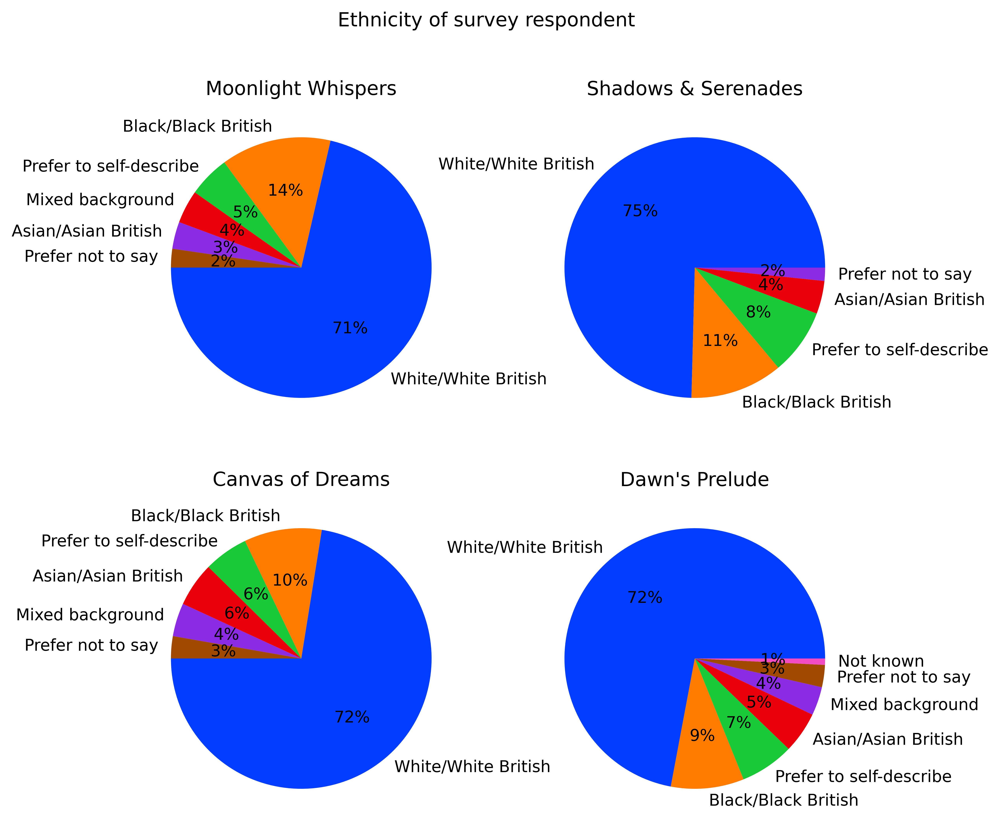

In [9]:
import matplotlib.pyplot as plt # for all the graphs I'll need
import seaborn # better aesthetics

# Setting up the subplot
palette_color = seaborn.color_palette('bright') 
fig, ((a1,a2),(a3,a4))  =  plt.subplots(2,2, dpi=600, figsize=(8,8))
fig.suptitle("Ethnicity of survey respondent")

# Defining data to use in each plot, what angle and show percentages
a1.pie(moonlit_count, labels=moonlit_count_names, colors=palette_color, autopct='%.0f%%', startangle=180)
a2.pie(shadows_count, labels=shadows_count_names, colors=palette_color, autopct='%.0f%%')
a3.pie(canvas_count, labels=canvas_count_names, colors=palette_color, autopct='%.0f%%', startangle=180)
a4.pie(dawn_count, labels=dawn_count_names, colors=palette_color, autopct='%.0f%%')

# Defining titles
a1.set_title("Moonlight Whispers")
a2.set_title("Shadows & Serenades")
a3.set_title("Canvas of Dreams")
a4.set_title("Dawn's Prelude")

From this figure, ethnicity groups differ between events by a maximum of 5%. The White/White British ethnicity ranges from 71-75% and form the largest ethnicity in every event, with Shadows & Serenades showing the biggest proportion of White/White British. This is followed by black and black British which ranges from 9-14%, with 14% of respondents identifying as Black/Black British in Moonlight Whispers.

Since ethnicity is similar across events, it is not deemed necessary to analyse sub-ethnic groups.

### 3. A. b) Gender Identity

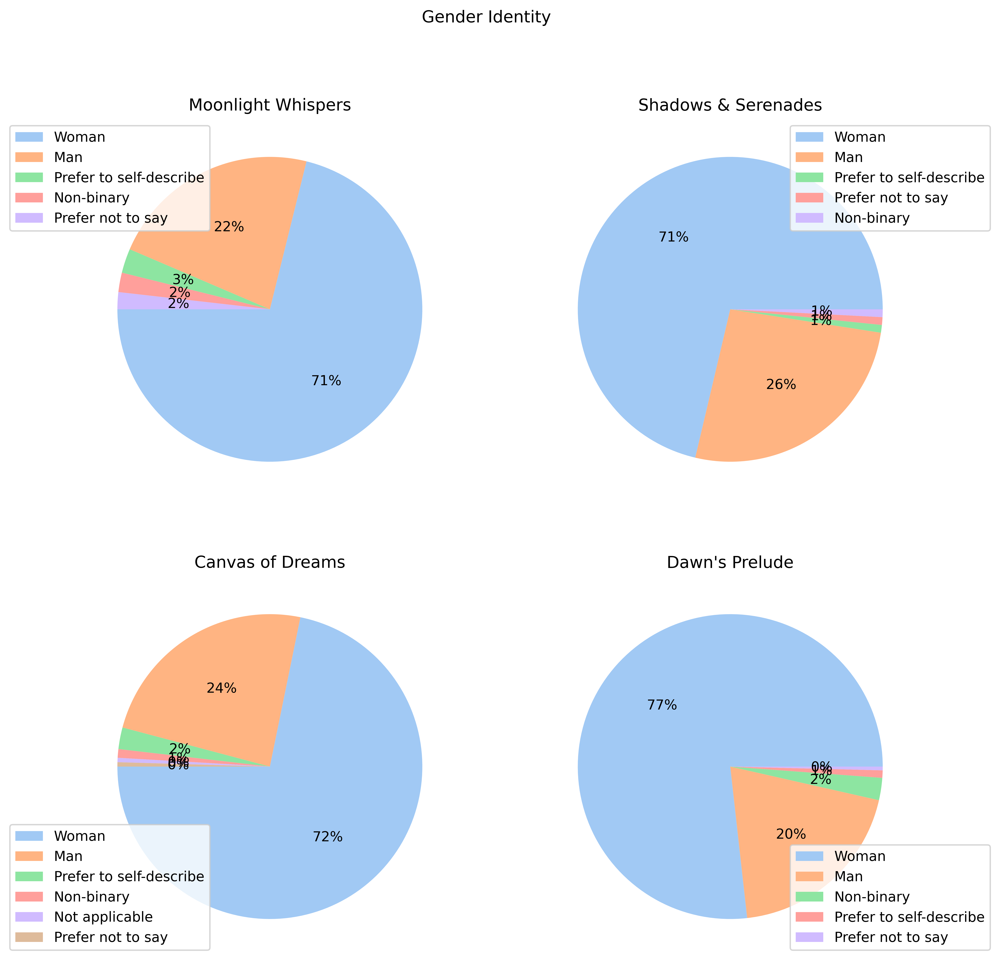

In [10]:
# Same as ethnicity

moonlit_count = pd.DataFrame(moonlit['gender_identity'].value_counts()) # do value counts and convert to dataframe
moonlit_count_names = moonlit_count.index.values.tolist() # ethnicities are the index so had to retrieve that
moonlit_count = list(moonlit_count.iloc[:, 0]) # listed the values

shadows_count = pd.DataFrame(shadows['gender_identity'].value_counts())
shadows_count_names = shadows_count.index.values.tolist()
shadows_count = list(shadows_count.iloc[:, 0])

canvas_count = pd.DataFrame(canvas['gender_identity'].value_counts())
canvas_count_names = canvas_count.index.values.tolist()
canvas_count = list(canvas_count.iloc[:, 0])

dawn_count = pd.DataFrame(dawn['gender_identity'].value_counts())
dawn_count_names = dawn_count.index.values.tolist()
dawn_count = list(dawn_count.iloc[:, 0])

# Plot

palette_color = seaborn.color_palette('pastel') 
fig, ((a1,a2),(a3,a4))  =  plt.subplots(2,2, dpi=600, figsize=(11,11))
fig.suptitle("Gender Identity")

a1.pie(moonlit_count, colors=palette_color, autopct='%.0f%%', startangle=180)
a2.pie(shadows_count, colors=palette_color, autopct='%.0f%%')
a3.pie(canvas_count, colors=palette_color, autopct='%.0f%%', startangle=180)
a4.pie(dawn_count, colors=palette_color, autopct='%.0f%%')

a1.set_title("Moonlight Whispers")
a2.set_title("Shadows & Serenades")
a3.set_title("Canvas of Dreams")
a4.set_title("Dawn's Prelude")

# Defining Legends since labels were overlapping
a1.legend(labels=moonlit_count_names, loc='upper left', bbox_to_anchor=(-0.2, 1))
a2.legend(labels=shadows_count_names, loc='upper right', bbox_to_anchor=(1.2, 1))
a3.legend(labels=canvas_count_names, loc='lower left', bbox_to_anchor=(-0.2, 0))
a4.legend(labels=dawn_count_names, loc='lower right', bbox_to_anchor=(1.2, 0))

From this figure, it can be concluded that women form the highest proportion of survey respondents in all events. Approximately 71-72% of respondents were women in three of the events, however, 77% of respondents for Dawn's Prelude are women. Men range from 20 - 26% of respondents, with only 20% seen in Dawn's Prelude. The total proportion of other identities does not exceed 7% in any of the four events.

### 3. A. c) Residence

Text(0, 0.5, 'Count')

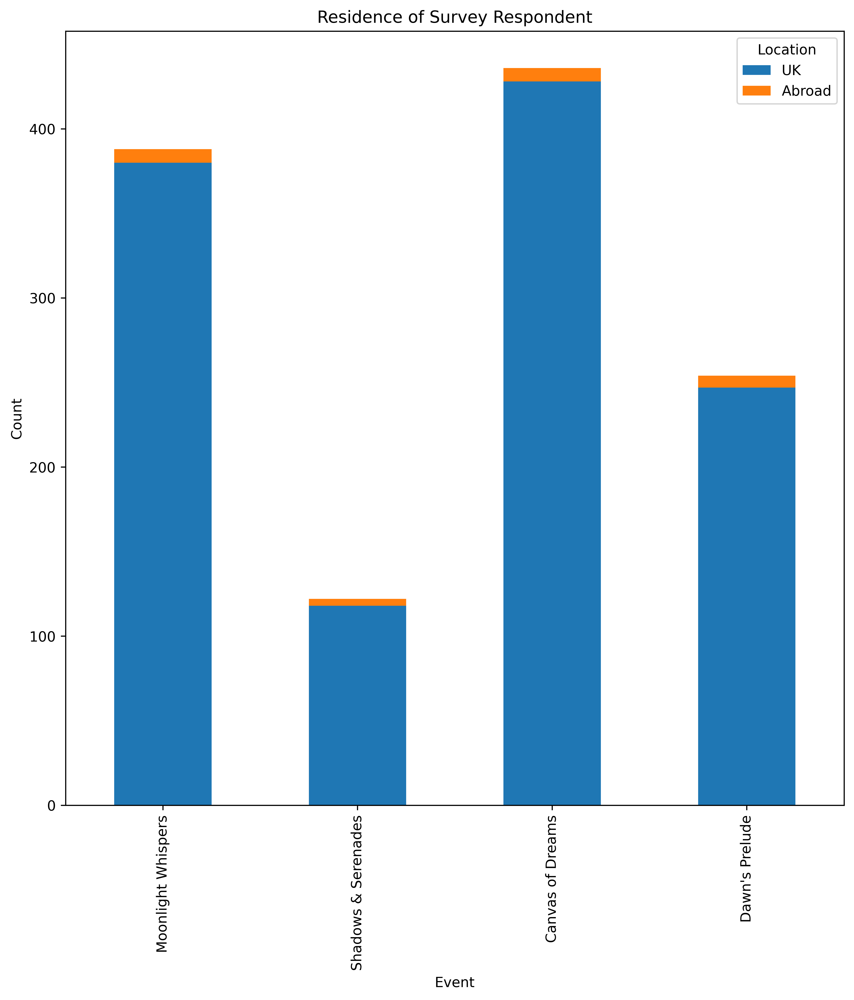

In [11]:
# Retrieving counts of location attribute
moonlit_count = pd.DataFrame(moonlit['location'].value_counts()) # do value counts and convert to dataframe
moonlit_count = list(moonlit_count.iloc[:, 0]) # listed the values

shadows_count = pd.DataFrame(shadows['location'].value_counts())
shadows_count = list(shadows_count.iloc[:, 0])

canvas_count = pd.DataFrame(canvas['location'].value_counts())
canvas_count = list(canvas_count.iloc[:, 0])

dawn_count = pd.DataFrame(dawn['location'].value_counts())
dawn_count = list(dawn_count.iloc[:, 0])

# Creating precursor dataframe for correct format into bar chart
loc_dict = {'Location': ['UK', 'Abroad'],
            'Moonlight Whispers': moonlit_count,
            'Shadows & Serenades': shadows_count,
            'Canvas of Dreams': canvas_count,
            "Dawn's Prelude": dawn_count}
location = pd.DataFrame(loc_dict).set_index('Location')


## Plot
fig, a1  =  plt.subplots(1,1, dpi=600, figsize=(10,10)) #easy resizing

location.T.plot(kind='bar', stacked=True, ax=a1)
a1.set_xlabel("Event")
a1.set_title("Residence of Survey Respondent")
a1.set_ylabel("Count")

This figure shows that most survey respondents live in the UK across all events. Canvas of Dreams is the event with the most survey respondents (436), whereas Shadows & Serenades had the fewest (122).

### 3. A. d) Age

Text(0.5, 1.0, "Dawn's Prelude")

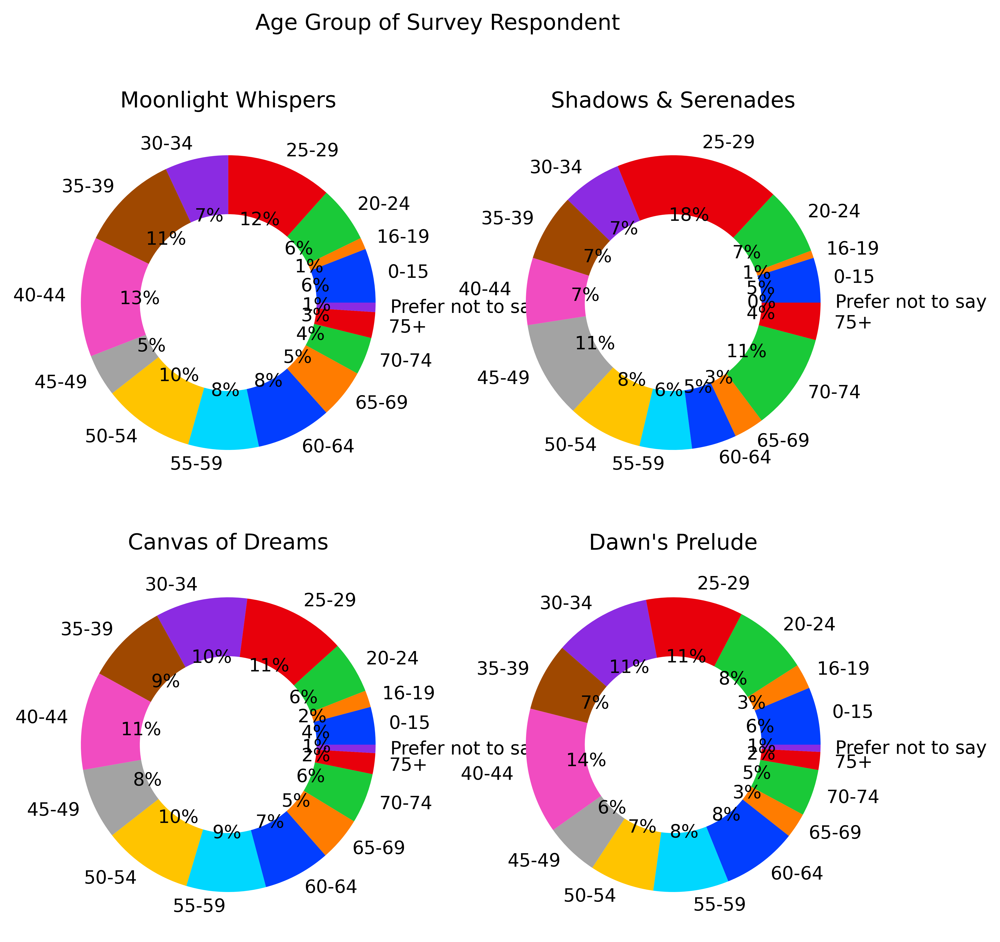

In [12]:
# Retrieving counts for each age group
moonlit_count = pd.DataFrame(moonlit['age'].value_counts())
moonlit_count.rename(columns={'count': 'moonlit'}, inplace=True) #change column name because will merge

shadows_count = pd.DataFrame(shadows['age'].value_counts())
shadows_count.rename(columns={'count': 'shadows'}, inplace=True)

canvas_count = pd.DataFrame(canvas['age'].value_counts())
canvas_count.rename(columns={'count': 'canvas'}, inplace=True)

dawn_count = pd.DataFrame(dawn['age'].value_counts())
dawn_count.rename(columns={'count': 'dawn'}, inplace=True)

# Joining datasets
combined = moonlit_count.join(shadows_count).join(canvas_count).join(dawn_count)
combined = combined.sort_index() # puts the categories into age order
combined = combined.fillna(0).astype('float') #any NaN values become 0 + make df floats for seaborn

age_groups = combined.index.values.tolist() # retrieve labels on chart from df

### Plotting - wedgeprops makes white middle which makes easier to read donut chart
palette_color = seaborn.color_palette('bright') 
fig, ((a1,a2),(a3,a4))  =  plt.subplots(2,2, dpi=600, figsize=(8,8))
fig.suptitle("Age Group of Survey Respondent")

# Plot the subplots
a1.pie(list(combined.iloc[:, 0]), labels=age_groups, colors=palette_color, autopct='%.0f%%', wedgeprops=dict(width=0.4))
a2.pie(list(combined.iloc[:, 1]), labels=age_groups, colors=palette_color, autopct='%.0f%%', wedgeprops=dict(width=0.4))
a3.pie(list(combined.iloc[:, 2]), labels=age_groups, colors=palette_color, autopct='%.0f%%', wedgeprops=dict(width=0.4))
a4.pie(list(combined.iloc[:, 3]), labels=age_groups, colors=palette_color, autopct='%.0f%%', wedgeprops=dict(width=0.4))

a1.set_title("Moonlight Whispers")
a2.set_title("Shadows & Serenades")
a3.set_title("Canvas of Dreams")
a4.set_title("Dawn's Prelude")

This figure shows the difference in ages of survey respondents. The total proportion of groups within years 0-44 are similar across all events, making the majority in all, yet they make the largest majority in Dawn's Prelude. 

The 25-29 age group at 18% in Shadows & Serenades shows the largest proportion amongst all age groups and events. Apart from the respondents who preferred not to state an age group, the 75+ and 16-19 age groups do not individually exceed 4% in any event.

### 3. A. e) Post Code

In [13]:
## Import required libraries
import warnings 
warnings.filterwarnings('ignore', category=FutureWarning) # Only future warnings are ignored for better viewing
import pgeocode
import plotly.express as px

# Make new dataframe with postcode
moonlit_post = moonlit.loc[:, ['survey', 'uk_postcode']]
shadows_post = shadows.loc[:, ['survey', 'uk_postcode']]
canvas_post = canvas.loc[:, ['survey', 'uk_postcode']]
dawn_post = dawn.loc[:, ['survey', 'uk_postcode']]

# Define function to use for various dataframes
def mapping(df_map):
    
    # Set post code country
    nomi = pgeocode.Nominatim('gb')
    
    # Apply function to post code !!strings!! to convert to longitude and latitude
    df_map["latitude"] = df_map["uk_postcode"].apply(lambda x: nomi.query_postal_code(str(x))[9])
    df_map["longitude"] = df_map["uk_postcode"].apply(lambda x: nomi.query_postal_code(str(x))[10])
    
    # Plot dots at locations on map
    fig = px.scatter_mapbox(df_map, lat="latitude", lon="longitude", zoom=4, height=300)
    fig.update_layout(mapbox_style="open-street-map")
    fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
    fig.show()

In [14]:
print("Post code distribution of survey respondents to the 'Moonlit Whispers' event")
mapping(moonlit_post)

Post code distribution of survey respondents to the 'Moonlit Whispers' event


In [15]:
print("Post code distribution of survey respondents to the 'Shadows & Serenades' event")
mapping(shadows_post)

Post code distribution of survey respondents to the 'Shadows & Serenades' event


In [16]:
print("Post code distribution of survey respondents to the 'Canvas of Dreams' event")
mapping(canvas_post)

Post code distribution of survey respondents to the 'Canvas of Dreams' event


In [17]:
print("Post code distribution of survey respondents to the 'Dawn's Prelude' event")
mapping(dawn_post)

Post code distribution of survey respondents to the 'Dawn's Prelude' event


The above maps show the distribution of Post Codes of survey respondents. There are no distinct differences between events.

### 3. A. f) Section Summary
Demographics between events seem to be mostly equal. The largest notable differences are that men show their lowest proportion in Dawn's Prelude, Black/Black British their highest proportion in moonlight whispers, and that 0-49 year olds make their biggest majority in Dawn's Prelude.

## 3. B. Dimensions
Dimensions are scored from 0 to 1. Higher values indicate that survey respondents more strongly associate the event with the dimension, while lower values suggest a weaker association.

This section is split into subheadings for each dimension, with a boxplot and brief analysis for each. Producing Boxplots provide an easy view of many different statistical descriptors of numeric attributes. This will allow for direct comparison between events.

### 3. B. a) Captivation

Text(0.5, 1.0, 'Captivation Score Spread by Survey')

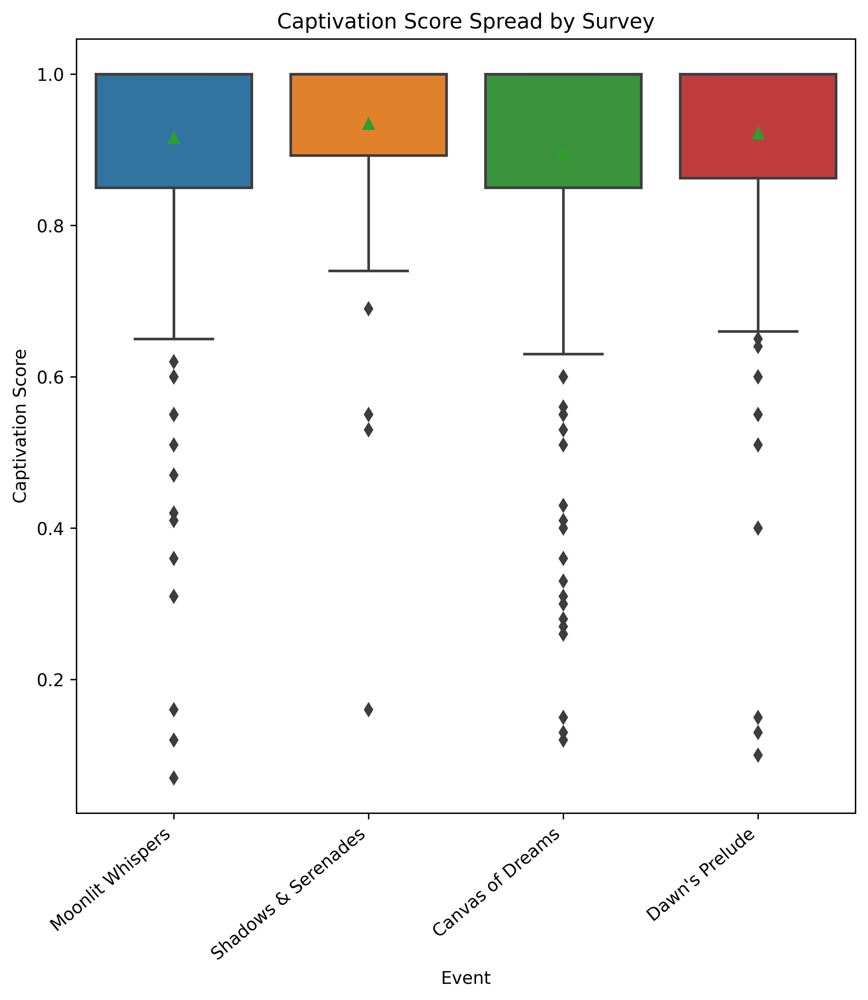

In [18]:
## Join all dataframes - this is useful for next numeric attributes too
dim_combined = pd.concat([moonlit, shadows, canvas, dawn]).reset_index().drop(['index'], axis=1)

# Convert numeric strings into floats
dim_combined['captivation'] = dim_combined['captivation'].astype(float) 

# Make subplot area
fig, a1  =  plt.subplots(1,1, dpi=600, figsize=(8,8))

# Plot subplot
seaborn.boxplot(y="captivation", x= "survey", data=dim_combined,  orient='v', showmeans=True, ax=a1)

# Add decorations to subplot
a1.set_xticklabels(a1.get_xticklabels(), rotation=40, ha="right")
a1.set_ylabel('Captivation Score')
a1.set_xlabel('Event')
a1.set_title('Captivation Score Spread by Survey')

The captivation score helps us quantify if survey respondents felt that the event was absorbing and held attention.

We see in this figure that the Shadows & Serenades event scored highest overall, given that its mean was the highest, and the lower quartile of respondents were spread higher than the lower quartile in other events. However, the median score of 1 is the same in all events.

Canvas of Dreams produces the lowest mean, mainly due to numerous extreme values. However, it is unclear whether this represents the poorest performance for this dimension, as it shares a similar spread with other events.

### 3. B. b) Concept

Text(0.5, 1.0, 'Concept Score Spread by Event')

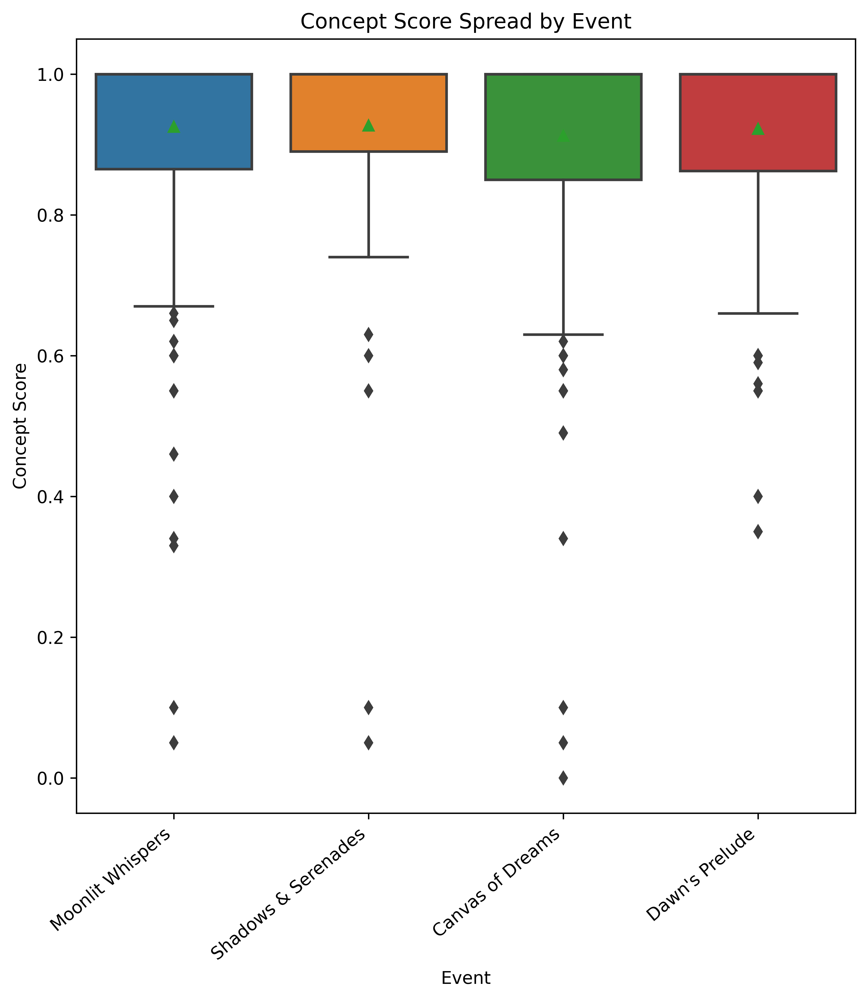

In [19]:
# Convert numeric strings into floats and make errors NaN
dim_combined['concept'] = pd.to_numeric(dim_combined['concept'], errors='coerce')

# Plot Subplot area
fig, a1  =  plt.subplots(1,1, dpi=600, figsize=(8,8))

# Plot subplot
seaborn.boxplot(y="concept", x= "survey", data=dim_combined,  orient='v', showmeans=True, ax=a1)

# Decorations
a1.set_xticklabels(a1.get_xticklabels(), rotation=40, ha="right")
a1.set_ylabel('Concept Score')
a1.set_xlabel('Event')
a1.set_title('Concept Score Spread by Event')

The concept score helps us quantify if survey respondents felt that the event was an interesting idea.

We see in this figure that the Shadows & Serenades event scored highest overall, given that the lower quartile of respondents was spread higher than the lower quartile in other events, and this is also true for the interquartile range. However, the median score of 1 is the same in all events, and mean values are all similar.

### 3. B. c) Rigour

Text(0.5, 1.0, 'Rigour Score Spread by Event')

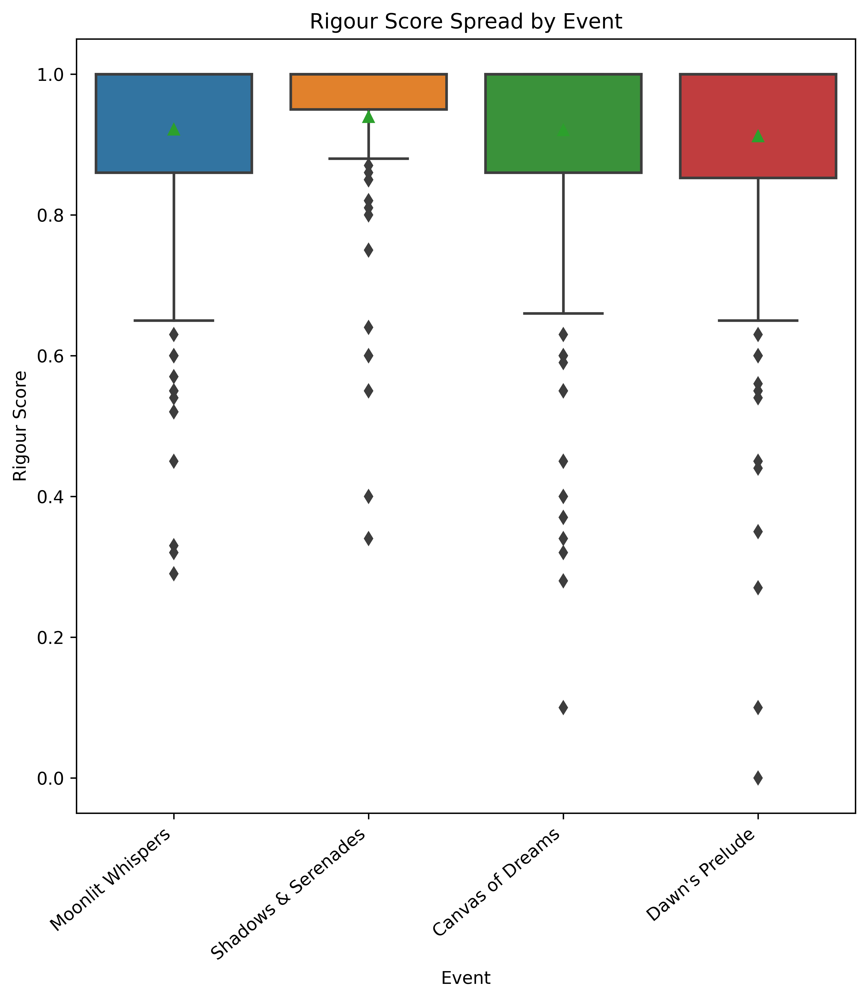

In [20]:
# Convert numeric strings into floats and make errors NaN
dim_combined['rigour'] = pd.to_numeric(dim_combined['rigour'], errors='coerce')

# Plot
fig, a1  =  plt.subplots(1,1, dpi=600, figsize=(8,8))

seaborn.boxplot(y="rigour", x= "survey", data=dim_combined,  orient='v', showmeans=True, ax=a1)

a1.set_xticklabels(a1.get_xticklabels(), rotation=40, ha="right")
a1.set_ylabel('Rigour Score')
a1.set_xlabel('Event')
a1.set_title('Rigour Score Spread by Event')

The rigour score helps us quantify if survey respondents felt that the event was well thought through and put together.

We see in this figure that the Shadows & Serenades event scored highest overall, given that the mean and all quartiles are higher than other events. The other events all performed very similarly, as can be seen by similar quartiles and mean. All events had a median of 1.

### 3. B. d) Thought Provoking

Text(0.5, 1.0, 'Thought Provoking Score Spread by Event')

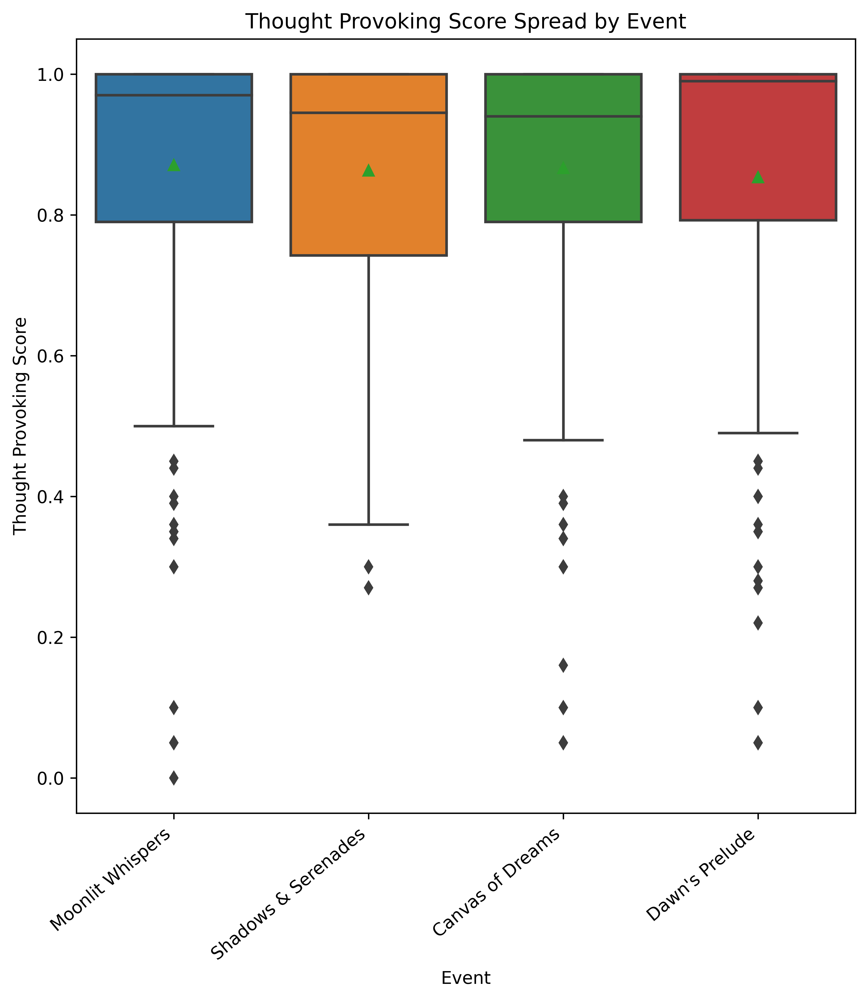

In [21]:
# Convert numeric strings into floats and make errors NaN
dim_combined['thought_provoking'] = pd.to_numeric(dim_combined['thought_provoking'], errors='coerce') #converted a string to NaN if not numeric

# Plot
fig, a1  =  plt.subplots(1,1, dpi=600, figsize=(8,8))

seaborn.boxplot(y="thought_provoking", x= "survey", data=dim_combined,  orient='v', showmeans=True, ax=a1)

a1.set_xticklabels(a1.get_xticklabels(), rotation=40, ha="right")
a1.set_ylabel('Thought Provoking Score')
a1.set_xlabel('Event')
a1.set_title('Thought Provoking Score Spread by Event')

We see in this figure that all events have similar spread and similar mean. However, the lower quartile of Shadows & Serenades ranges lower than the lower quartiles of other events. 

Overall, Dawn's Prelude scored highest in this dimension because it had the highest median despite similar spread to other events.

### 3. B. e) Relevance

Text(0.5, 1.0, 'Relevance Score Spread by Event')

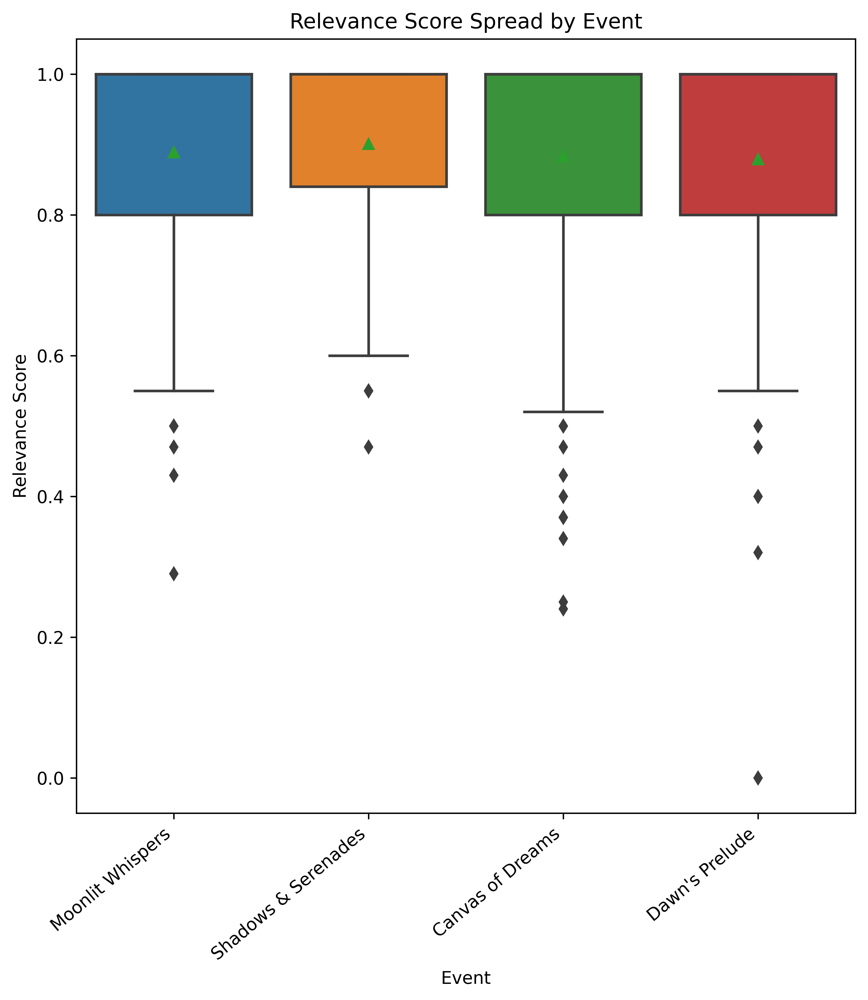

In [22]:
# Convert numeric strings into floats and make errors NaN
dim_combined['relevance'] = pd.to_numeric(dim_combined['relevance'], errors='coerce') #converted a string to NaN if not numeric

# Plot
fig, a1  =  plt.subplots(1,1, dpi=600, figsize=(8,8))

seaborn.boxplot(y="relevance", x= "survey", data=dim_combined,  orient='v', showmeans=True, ax=a1)

a1.set_xticklabels(a1.get_xticklabels(), rotation=40, ha="right")
a1.set_ylabel('Relevance Score')
a1.set_xlabel('Event')
a1.set_title('Relevance Score Spread by Event')

The relevance score helps us quantify if survey respondents felt that the event had something to say about modern society.

We see in this figure that the Shadows & Serenades event scored highest compared to other events, given that the lower quartile of respondents was spread higher, the interquartile range was higher and the mean was slightly higher. However, the median score of 1 is the same in all events.

### 3. B. f) Distinctiveness

Text(0.5, 1.0, 'Distinctiveness Score Spread by Event')

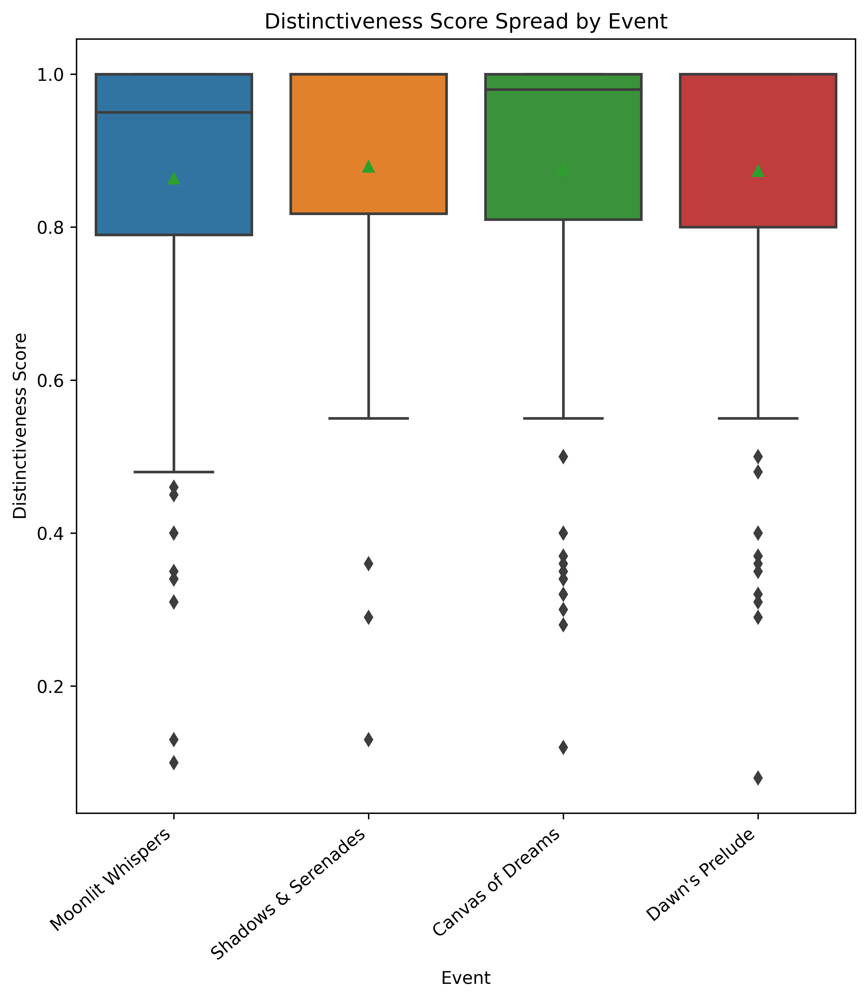

In [23]:
# Convert numeric strings into floats and make errors NaN
dim_combined['distinctiveness'] = pd.to_numeric(dim_combined['distinctiveness'], errors='coerce') #converted a string to NaN if not numeric

#Plot
fig, a1  =  plt.subplots(1,1, dpi=600, figsize=(8,8))

seaborn.boxplot(y="distinctiveness", x= "survey", data=dim_combined,  orient='v', showmeans=True, ax=a1)

a1.set_xticklabels(a1.get_xticklabels(), rotation=40, ha="right")
a1.set_ylabel('Distinctiveness Score')
a1.set_xlabel('Event')
a1.set_title('Distinctiveness Score Spread by Event')

The distinctiveness score helps us quantify if survey respondents felt that the event was different from things they had experienced before.

Moonlit Whispers performs the worst, given the lowest mean, median and lower 50% out of all events.

Shadows & Serenades and Dawn's Prelude are the best performing events, sharing similar spread, mean and median.

### 3. B. g) Section Summary
The Shadows & Serenades event performed best overall, particularly in the captivation, concept, rigour and relevance dimensions. When considering all dimensions, the median, mean, and spread showed similar results, making it challenging to make an overall performance comparison between them.

## 3. C. Intelligence
Intelligence attributes capture other factors which might influence the respondents' opinions about their experience.

This section is split into subheadings for each dimension, with a visualisation and brief analysis for each. Since these attributes have discrete values, this section looks at the proportion and counts of each attribute and compares them amongst events.

### 3. C. a) Expectations

Text(0, 0.5, 'Percentage')

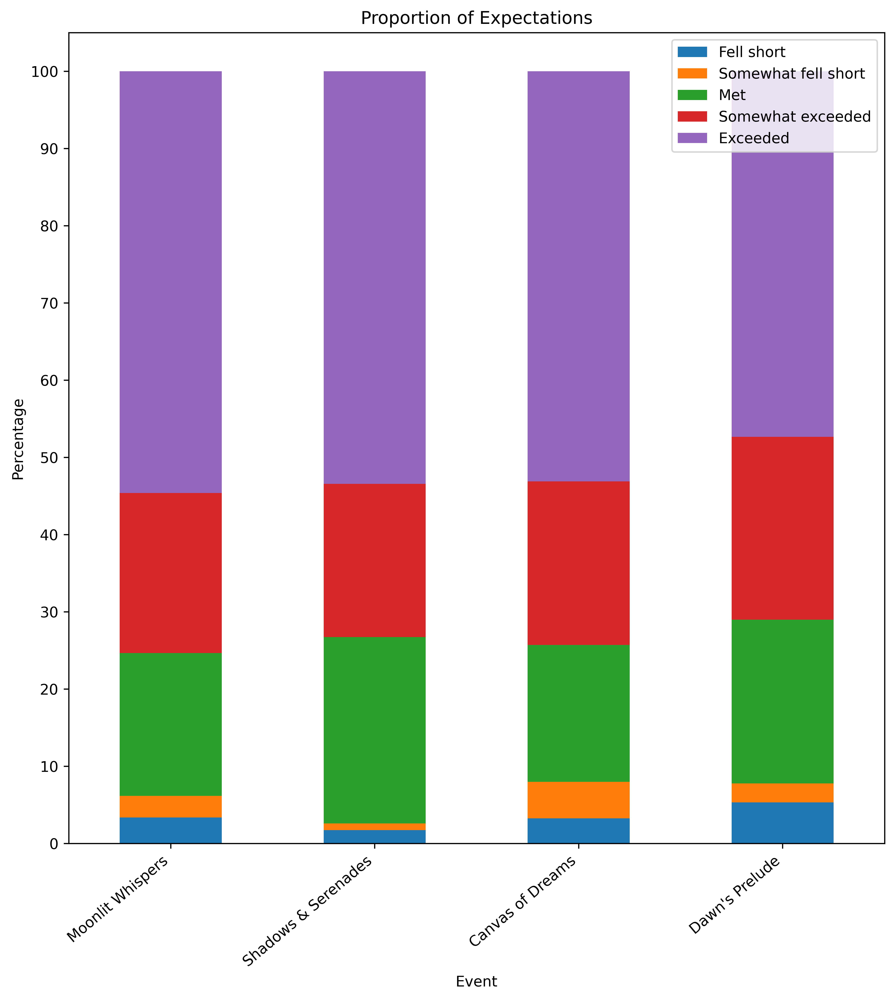

In [24]:
## Retrieving counts of attribute
moonlit_count_int = pd.DataFrame(moonlit['compare_to_expectations'].value_counts())
moonlit_count_int.rename(columns={'count': 'moonlit'}, inplace=True)

shadows_count_int = pd.DataFrame(shadows['compare_to_expectations'].value_counts())
shadows_count_int.rename(columns={'count': 'shadows'}, inplace=True)

canvas_count_int = pd.DataFrame(canvas['compare_to_expectations'].value_counts())
canvas_count_int.rename(columns={'count': 'canvas'}, inplace=True)

dawn_count_int = pd.DataFrame(dawn['compare_to_expectations'].value_counts())
dawn_count_int.rename(columns={'count': 'dawn'}, inplace=True)

# Joining datasets
combined_int = moonlit_count_int.join(shadows_count_int).join(canvas_count_int).join(dawn_count_int)
combined_int = combined_int.sort_index()
combined_int = combined_int.fillna(0).astype('float').drop(['I had no expectations']) # removed as isnt dependent on event

# Order the index ascending for correct display in stacked bar
reorderlist = ['Fell short',
               'Somewhat fell short',
               'Met',
               'Somewhat exceeded',
               'Exceeded']
combined_int = combined_int.reindex(reorderlist)

# Make new dataframe with % calculated instead of counts
comb_int_per = pd.DataFrame()

comb_int_per['Moonlit Whispers'] = (combined_int['moonlit'] /
                  combined_int['moonlit'].sum()) * 100
comb_int_per['Shadows & Serenades'] = (combined_int['shadows'] /
                  combined_int['shadows'].sum()) * 100
comb_int_per['Canvas of Dreams'] = (combined_int['canvas'] /
                  combined_int['canvas'].sum()) * 100
comb_int_per["Dawn's Prelude"] = (combined_int['dawn'] /
                  combined_int['dawn'].sum()) * 100
comb_int_per = comb_int_per.T

# Plot the percentages
fig, a1  =  plt.subplots(1,1, dpi=600, figsize=(10,10)) #easy resizing

comb_int_per.plot(kind = 'bar', stacked=True, ax=a1)

# Decorations
a1.set_title('Proportion of Expectations')
a1.legend(title='', loc='upper right')
a1.set_yticks(np.arange(0, 110, 10))
a1.set_xticklabels(a1.get_xticklabels(), rotation=40, ha="right")
a1.set_xlabel('Event')
a1.set_ylabel('Percentage')

This figure shows that Shadows & Serenades had the highest proportion of respondents who thought it met or exceeded their expectations, whereas Canvas of Dreams had the lowest. However, Moonlit Whispers had the highest proportion of those who felt the event exceeded expectations. 

Dawn's Prelude had the highest proportion that felt it fell short entirely, while Canvas of Dreams had similar proportion to Dawn's Prelude in the total of categories that did not meet expectation.

Overall, Moonlit exceeded expectation the most, whereas Shadows & Serenades met expectation the most.

### 3. C. b) Overall Experience

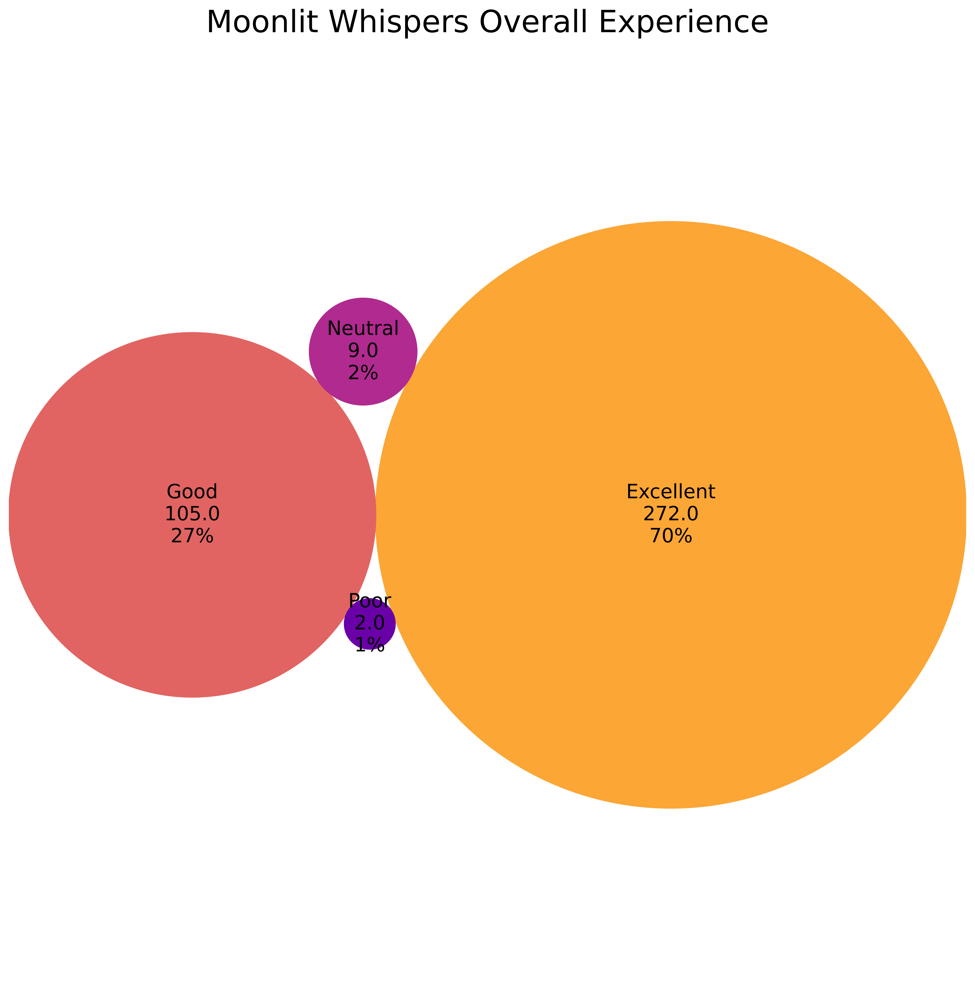

In [25]:
import circlify 

# Retrieve discrete attribute counts
moonlit_count_int = pd.DataFrame(moonlit['overall_experience'].value_counts())
shadows_count_int = pd.DataFrame(shadows['overall_experience'].value_counts())
canvas_count_int = pd.DataFrame(canvas['overall_experience'].value_counts())
dawn_count_int = pd.DataFrame(dawn['overall_experience'].value_counts())

# Change column name because will merge with columns of same name but different event
moonlit_count_int.rename(columns={'count': 'moonlit'}, inplace=True)
shadows_count_int.rename(columns={'count': 'shadows'}, inplace=True)
canvas_count_int.rename(columns={'count': 'canvas'}, inplace=True)
dawn_count_int.rename(columns={'count': 'dawn'}, inplace=True)

# Joining datasets
combined_int = moonlit_count_int.join(shadows_count_int).join(canvas_count_int).join(dawn_count_int)
combined_int = combined_int.sort_index()
combined_int = combined_int.fillna(0).astype('float')


# Make new dataframe with % calculated instead of counts
comb_int_per = combined_int
comb_int_per['moon_percent'] = (comb_int_per['moonlit'] /
                  comb_int_per['moonlit'].sum()) * 100
comb_int_per['shad_percent'] = (comb_int_per['shadows'] /
                  comb_int_per['shadows'].sum()) * 100
comb_int_per['canv_percent'] = (comb_int_per['canvas'] /
                  comb_int_per['canvas'].sum()) * 100
comb_int_per['dawn_percent'] = (comb_int_per['dawn'] /
                  comb_int_per['dawn'].sum()) * 100

# Compute circle positions
circles = circlify.circlify(combined_int['moonlit'].tolist(), 
                            show_enclosure=False, 
                            target_enclosure=circlify.Circle(x=0, y=0)
                           )
circles.reverse()

# Define pallette
pal_ = list(seaborn.color_palette(palette='plasma_r',
                              n_colors=len(comb_int_per)).as_hex())

# Make labels to include count, name and percentage
label = [i+'<br>'+str(j)+'<br>'+str(round(k))+'%' for i,j,k in zip(comb_int_per.index,
                                                            comb_int_per.moonlit,
                                                            comb_int_per.moon_percent)]

# Make plot area
fig, a1 = plt.subplots(figsize=(14,14), dpi=600, facecolor='white')

a1.axis('off')

# Set limits on objects to stay in the plot area
lim = max(max(abs(circle.x)+circle.r, abs(circle.y)+circle.r,) for circle in circles)
plt.xlim(-lim, lim)
plt.ylim(-lim, lim)

# Display the circles
for circle, note, color in zip(circles, label, pal_):
    x, y, r = circle
    a1.add_patch(plt.Circle((x, y), r, alpha=1, color = color))
    plt.annotate(note.replace('<br>','\n'), (x,y), size=16, va='center', ha='center')
plt.title("Moonlit Whispers Overall Experience", fontsize=25)
plt.xticks([])
plt.yticks([])
plt.show()

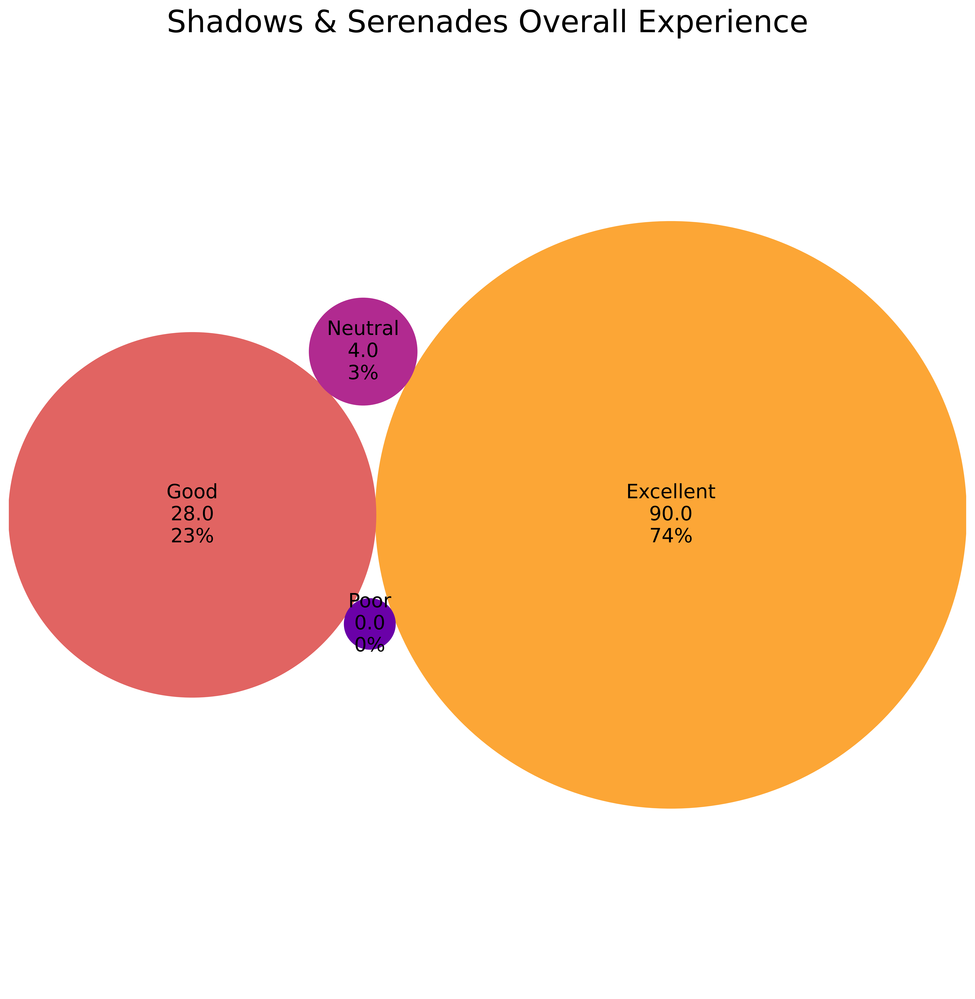

In [26]:
# Make labels to include count, name and percentage
label = [i+'<br>'+str(j)+'<br>'+str(round(k))+'%' for i,j,k in zip(comb_int_per.index,
                                                            comb_int_per.shadows,
                                                            comb_int_per.shad_percent)]

# Make plot area
fig, a1 = plt.subplots(figsize=(14,14), dpi=600, facecolor='white')

a1.axis('off')

# Set limits on objects to stay in the plot area
lim = max(max(abs(circle.x)+circle.r, abs(circle.y)+circle.r,) for circle in circles)
plt.xlim(-lim, lim)
plt.ylim(-lim, lim)

# Display the circles
for circle, note, color in zip(circles, label, pal_):
    x, y, r = circle
    a1.add_patch(plt.Circle((x, y), r, alpha=1, color = color))
    plt.annotate(note.replace('<br>','\n'), (x,y), size=16, va='center', ha='center')
plt.title("Shadows & Serenades Overall Experience", fontsize=25)
plt.xticks([])
plt.yticks([])
plt.show()

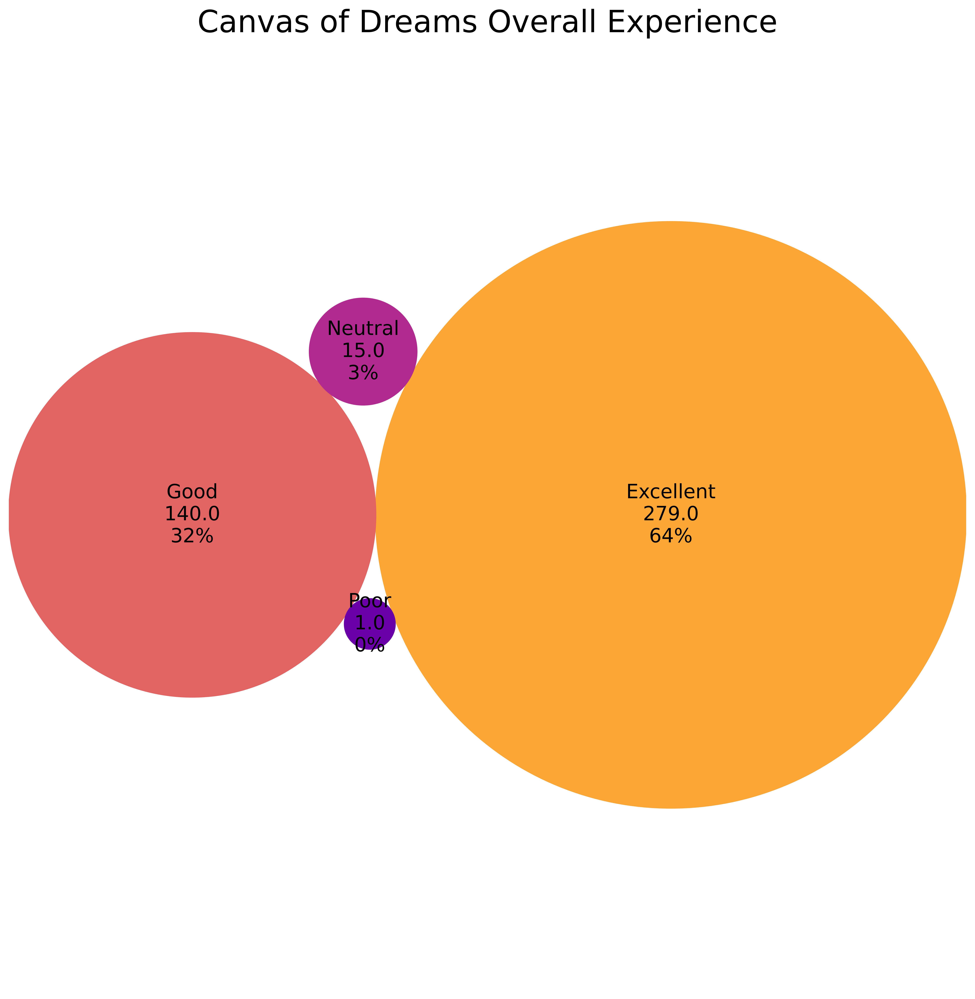

In [27]:
# Make labels to include count, name and percentage
label = [i+'<br>'+str(j)+'<br>'+str(round(k))+'%' for i,j,k in zip(comb_int_per.index,
                                                            comb_int_per.canvas,
                                                            comb_int_per.canv_percent)]

# Make plot area
fig, a1 = plt.subplots(figsize=(14,14), dpi=600, facecolor='white')

a1.axis('off')

# Set limits on objects to stay in the plot area
lim = max(max(abs(circle.x)+circle.r, abs(circle.y)+circle.r,) for circle in circles)
plt.xlim(-lim, lim)
plt.ylim(-lim, lim)

# Display the circles
for circle, note, color in zip(circles, label, pal_):
    x, y, r = circle
    a1.add_patch(plt.Circle((x, y), r, alpha=1, color = color))
    plt.annotate(note.replace('<br>','\n'), (x,y), size=16, va='center', ha='center')
plt.title("Canvas of Dreams Overall Experience", fontsize=25)
plt.xticks([])
plt.yticks([])
plt.show()

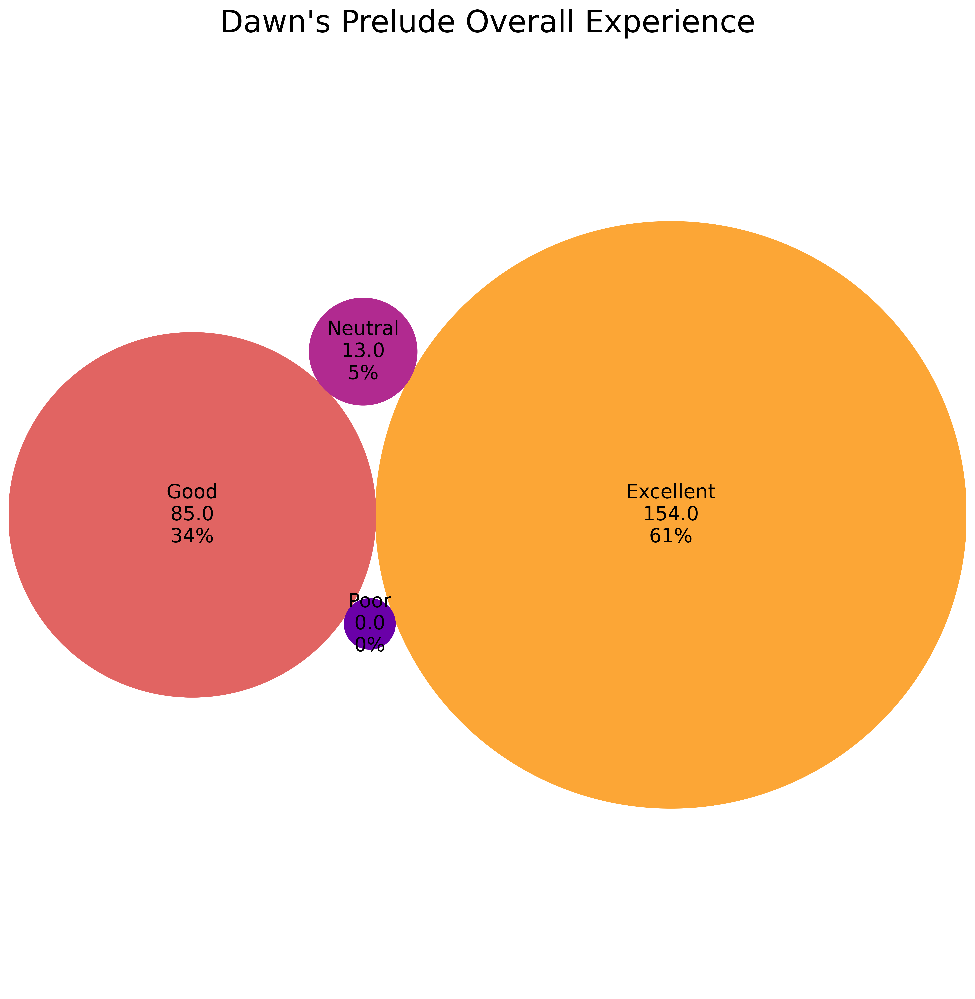

In [28]:
# Make labels to include count, name and percentage
label = [i+'<br>'+str(j)+'<br>'+str(round(k))+'%' for i,j,k in zip(comb_int_per.index,
                                                            comb_int_per.dawn,
                                                            comb_int_per.dawn_percent)]

# Make plot area
fig, a1 = plt.subplots(figsize=(14,14), dpi=600, facecolor='white')

a1.axis('off')

# Set limits on objects to stay in the plot area
lim = max(max(abs(circle.x)+circle.r, abs(circle.y)+circle.r,) for circle in circles)
plt.xlim(-lim, lim)
plt.ylim(-lim, lim)

# Display the circles
for circle, note, color in zip(circles, label, pal_):
    x, y, r = circle
    a1.add_patch(plt.Circle((x, y), r, alpha=1, color = color))
    plt.annotate(note.replace('<br>','\n'), (x,y), size=16, va='center', ha='center')
plt.title("Dawn's Prelude Overall Experience", fontsize=25)
plt.xticks([])
plt.yticks([])
plt.show()

The overall experience of respondents at all events was very good. Ratings of 'Excellent' made the largest proportion, followed by 'Good', 'Neutral' and 'Poor'. 'Neutral' and 'Poor' responses made less than 5% of all responses in all events.

Shadows & Serenades received the highest proportion of 'Excellent' responses with 74%, whereas Dawn's Prelude had the least at 61%.

### 3. C. c) Repeat Attendance
This attribute tells us the intention of respondents to attend similar events in the future.

Text(0, 0.5, 'Percentage')

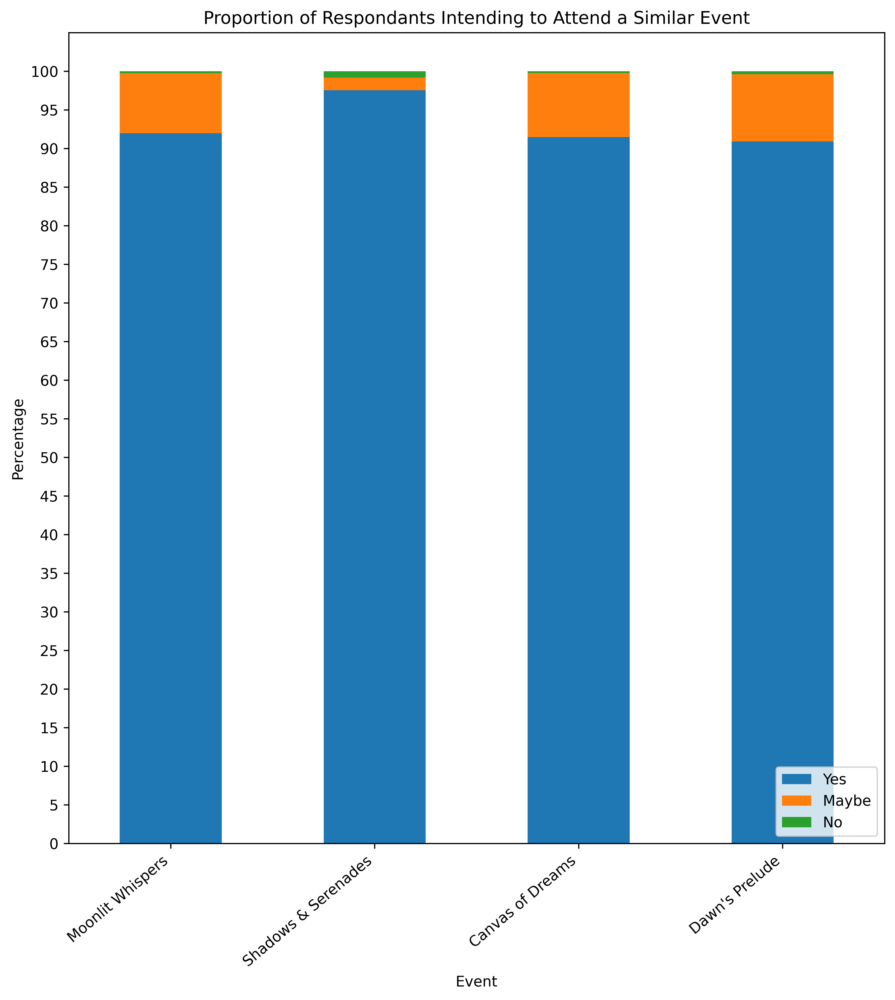

In [29]:
# Retrieve discrete attribute counts
moonlit_count_int = pd.DataFrame(moonlit['repeat_attendance'].value_counts())
shadows_count_int = pd.DataFrame(shadows['repeat_attendance'].value_counts())
canvas_count_int = pd.DataFrame(canvas['repeat_attendance'].value_counts())
dawn_count_int = pd.DataFrame(dawn['repeat_attendance'].value_counts())

# Change column name because will merge with columns of same name but different event
moonlit_count_int.rename(columns={'count': 'moonlit'}, inplace=True)
shadows_count_int.rename(columns={'count': 'shadows'}, inplace=True)
canvas_count_int.rename(columns={'count': 'canvas'}, inplace=True)
dawn_count_int.rename(columns={'count': 'dawn'}, inplace=True)

# Joining datasets
combined_int = moonlit_count_int.join(shadows_count_int).join(canvas_count_int).join(dawn_count_int)
combined_int = combined_int.sort_index()
combined_int = combined_int.fillna(0).astype('float')

# Removing 'other' category as negligible
combined_int = combined_int.drop(['Other (please specify)'])

reorderlist = ['Yes',
               'Maybe',
               'No']
combined_int = combined_int.reindex(reorderlist)

# Make new dataframe with % calculated instead of counts
comb_int_per = pd.DataFrame()

comb_int_per['Moonlit Whispers'] = (combined_int['moonlit'] /
                  combined_int['moonlit'].sum()) * 100
comb_int_per['Shadows & Serenades'] = (combined_int['shadows'] /
                  combined_int['shadows'].sum()) * 100
comb_int_per['Canvas of Dreams'] = (combined_int['canvas'] /
                  combined_int['canvas'].sum()) * 100
comb_int_per["Dawn's Prelude"] = (combined_int['dawn'] /
                  combined_int['dawn'].sum()) * 100
comb_int_per = comb_int_per.T

# Plot the percentages
fig, a1  =  plt.subplots(1,1, dpi=600, figsize=(10,10)) #easy resizing

comb_int_per.plot(kind = 'bar', stacked=True, ax=a1)

# Decorations
a1.set_title('Proportion of Respondants Intending to Attend a Similar Event')
a1.legend(title='', loc='lower right')
a1.set_yticks(np.arange(0, 105, 5))
a1.set_xticklabels(a1.get_xticklabels(), rotation=40, ha="right")
a1.set_xlabel('Event')
a1.set_ylabel('Percentage')

This figure shows that Shadows & Serenades had the lowest proportion of 'Maybe' responses and the highest proportion (98%) of respondents who intend to attend a similar event. Lower proportion (approximately 91%) of 'Yes' results were exhibited in Moonlit Whispers, Canvas of Dreams and Dawn's Prelude surveys.

Overall, Shadows & Serenades had the highest proportion of respondents who intended to attend a similar event in the future.

### 3. C. d) Previous Attendance
This attribute informs when the respondents last attended a different event by the same organisation.

Text(0, 0.5, 'Percentage')

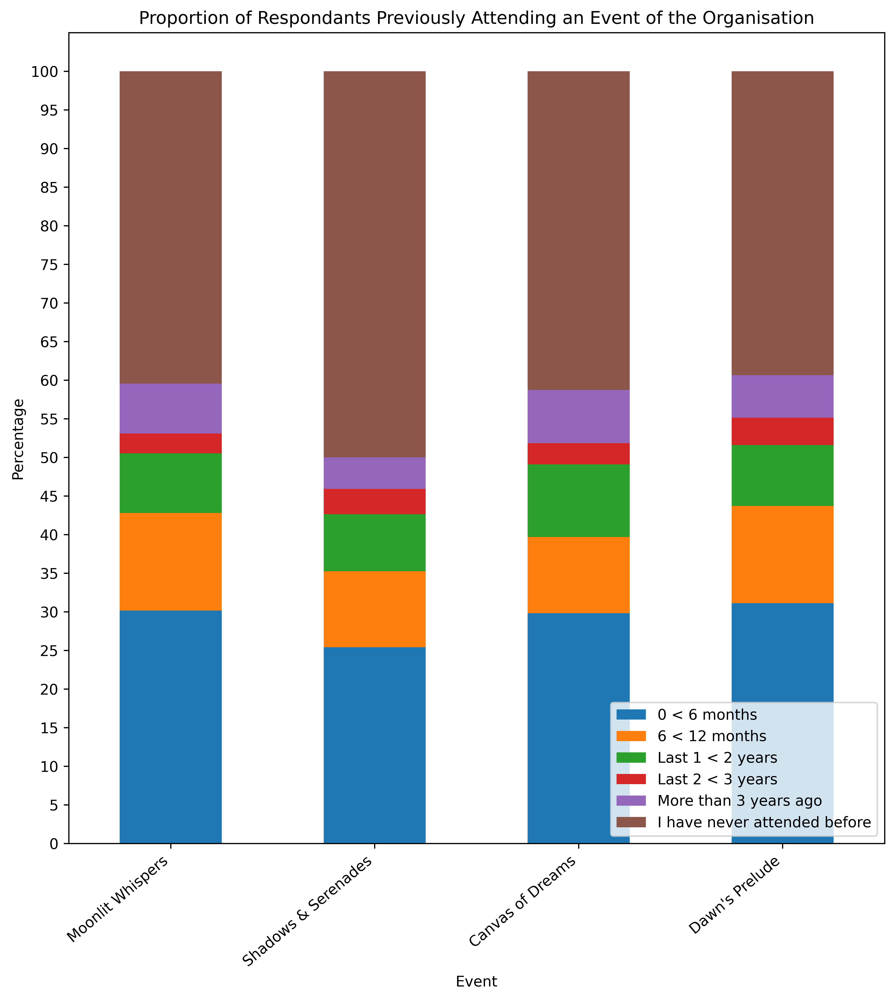

In [30]:
#['6 < 12 months', '0 < 6 months', 'I have never attended before',
#       'Last 1 < 2 years', 'Last 2 < 3 years', 'More than 3 years ago']

# Retrieve discrete attribute counts
moonlit_count_int = pd.DataFrame(moonlit['previous_attendance'].value_counts())
shadows_count_int = pd.DataFrame(shadows['previous_attendance'].value_counts())
canvas_count_int = pd.DataFrame(canvas['previous_attendance'].value_counts())
dawn_count_int = pd.DataFrame(dawn['previous_attendance'].value_counts())

# Change column name because will merge with columns of same name but different event
moonlit_count_int.rename(columns={'count': 'moonlit'}, inplace=True)
shadows_count_int.rename(columns={'count': 'shadows'}, inplace=True)
canvas_count_int.rename(columns={'count': 'canvas'}, inplace=True)
dawn_count_int.rename(columns={'count': 'dawn'}, inplace=True)

# Joining datasets
combined_int = moonlit_count_int.join(shadows_count_int).join(canvas_count_int).join(dawn_count_int)
combined_int = combined_int.sort_index()
combined_int = combined_int.fillna(0).astype('float')

# Reorder list into ascending timescales
reorderlist = ['0 < 6 months',
               '6 < 12 months',
               'Last 1 < 2 years',
               'Last 2 < 3 years',
               'More than 3 years ago',
               'I have never attended before']
combined_int = combined_int.reindex(reorderlist)

# Make new dataframe with % calculated instead of counts
comb_int_per = pd.DataFrame()

comb_int_per['Moonlit Whispers'] = (combined_int['moonlit'] /
                  combined_int['moonlit'].sum()) * 100
comb_int_per['Shadows & Serenades'] = (combined_int['shadows'] /
                  combined_int['shadows'].sum()) * 100
comb_int_per['Canvas of Dreams'] = (combined_int['canvas'] /
                  combined_int['canvas'].sum()) * 100
comb_int_per["Dawn's Prelude"] = (combined_int['dawn'] /
                  combined_int['dawn'].sum()) * 100
comb_int_per = comb_int_per.T

# Plot the percentages
fig, a1  =  plt.subplots(1,1, dpi=600, figsize=(10,10)) #easy resizing

comb_int_per.plot(kind = 'bar', stacked=True, ax=a1)

# Decorations
a1.set_title('Proportion of Respondants Previously Attending an Event of the Organisation')
a1.legend(title='', loc='lower right')
a1.set_yticks(np.arange(0, 105, 5))
a1.set_xticklabels(a1.get_xticklabels(), rotation=40, ha="right")
a1.set_xlabel('Event')
a1.set_ylabel('Percentage')

This figure shows that the Shadows & Serenades survey had the highest proportion of respondents that had never attended and event by the same organisation. Dawn's Prelude had the highest proportion that had attended an event by the same organisation within the last six months. Other discrete groups are similar across all events.

### 3. C. e) Section Summary
Shadows & Serenades had the highest proportion of respondents who felt it met or exceeded expectation, gave them an excellent experience and made them consider attending a similar event in the future. However, Shadows & Serenades also had the highest proportion of respondents who had never attended an event by the organisation at all, and the lowest proportion that had attended within the last six months.

## 3. D. Chapter Summary
The demographics across events appear largely consistent, making it feasible to conduct a fair analysis between them without a significant impact on the results.

In most attributes from Dimensions and Intelligence categories, Shadows & Serenades performed the best. Other events were very similar in many attributes and did not perform as well, yet they were not substantially inferior.

## 4. Associations
The aim of this chapter is to test attributes against each other to see if they are associated. These are selected based on patterns seen in the exploratory analysis chapter.
### 4. A. Intent to Attend a Similar Event in the Future given Previous Attendance

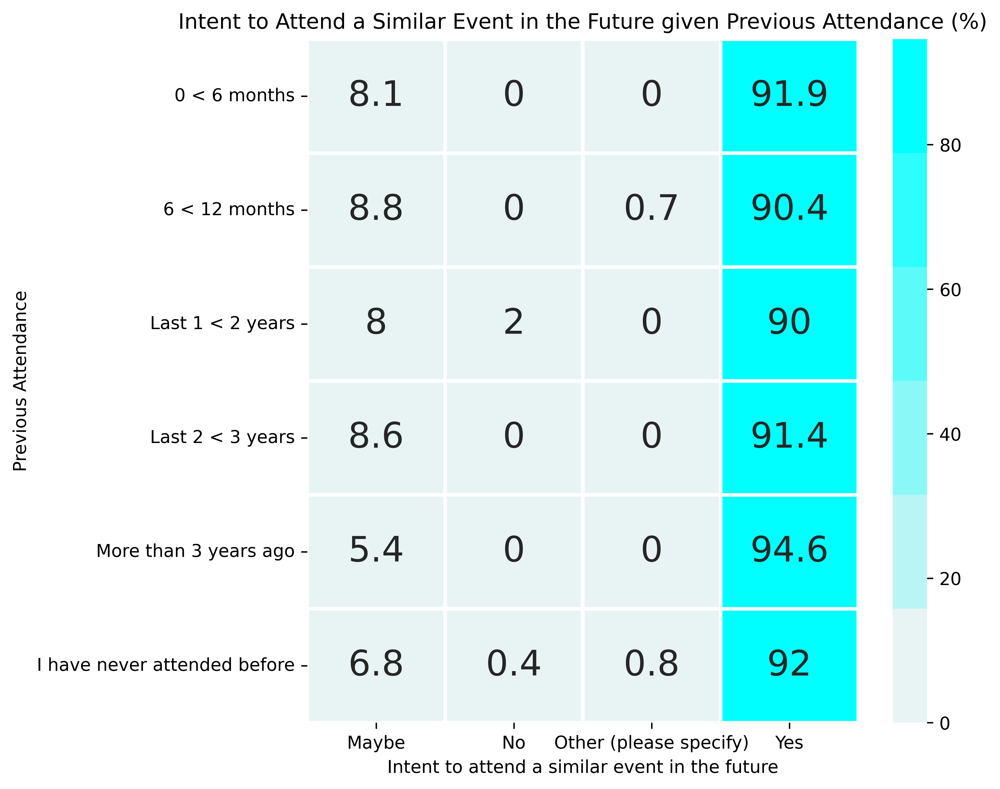

In [31]:
# using dim_combined dataframe previous created by combining all events
# Make crosstab to get conditional probabilities from two discrete attributes
prev_given_attend = pd.crosstab(dim_combined.previous_attendance, [dim_combined.repeat_attendance], normalize='index')

# Reorder so easier to follow on later graph
reorderlist = ['0 < 6 months',
               '6 < 12 months',
               'Last 1 < 2 years',
               'Last 2 < 3 years',
               'More than 3 years ago',
               'I have never attended before']
prev_given_attend = prev_given_attend.reindex(reorderlist)

# Create plot area
fig,ax = plt.subplots(1,1, dpi=600, figsize=(7,7))

# Create subplot
seaborn.heatmap(prev_given_attend.round(3)*100, cmap=seaborn.light_palette('#00ffff'), linewidths = 2,
            annot=True, ax=ax, annot_kws={"size": 20}, fmt='g')
ax.set_title('Intent to Attend a Similar Event in the Future given Previous Attendance (%)')
ax.set_ylabel('Previous Attendance')
ax.set_xlabel('Intent to attend a similar event in the future')
ax.tick_params(axis='x')
ax.tick_params(axis='y')

In [32]:
import scipy.stats as stats

# Create pivot table for counts of previous and repeat attendance categories
p1 = dim_combined.pivot_table(values=['overall_experience'], index=['previous_attendance'], columns=['repeat_attendance'], aggfunc='count')
p1 = p1.fillna(0) #fill NaN as 0

# Chi Squared
test_stat, p_value, dof, expected = stats.chi2_contingency(p1, correction=False)

print('Chi Squared test of time since visit of an event by the organisation and intention to attend a similar event in the future')
print('\nThere are %d degrees of freedom' % dof)
print('The chi-squared test statistic is %4.2f' % test_stat)
print('The p-value is %4.3f %%' % (100 * p_value))

Chi Squared test of time since visit of an event by the organisation and intention to attend a similar event in the future

There are 15 degrees of freedom
The chi-squared test statistic is 16.34
The p-value is 36.010 %


This heatmap shows that given when a respondent previously attended an event by the organisation, what percentage of respondents in a particular time frame group intend to attend a similar event in the future.

Across all previous attended time frames, a high percentage intend to attend a similar event in the future. 94.6% of respondents who had not been to an event by the organisation 'More than 3 years ago' stated that they would attend a similar event in the future - the highest out of all categories.

This analysis was chosen as it could be hypothesised that the time a respondent last went to an event by the organisation may impact if they are to attend a similar event. However, given a significance level of 5%, the null hypothesis is accepted as the p-value of the chi-squared test is 36%.

### 4. B. Meeting Expectations given Previous Attendance

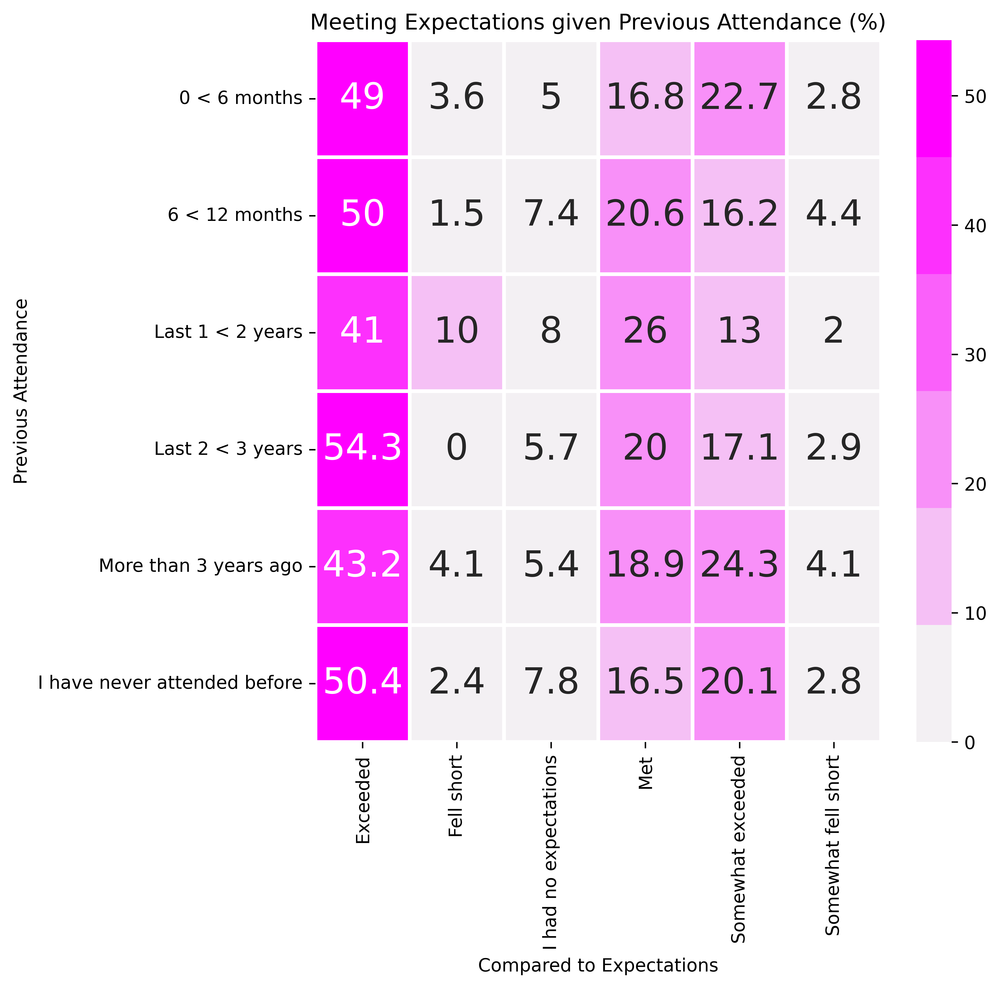

In [33]:
# Make crosstab to get conditional probabilities from two discrete attributes
expect_given_prev = pd.crosstab(dim_combined.previous_attendance, [dim_combined.compare_to_expectations], normalize='index')

# Reorder so easier to follow on later graph
reorderlist = ['0 < 6 months',
               '6 < 12 months',
               'Last 1 < 2 years',
               'Last 2 < 3 years',
               'More than 3 years ago',
               'I have never attended before']
expect_given_prev = expect_given_prev.reindex(reorderlist)

# Create plot area
fig,ax = plt.subplots(1,1, dpi=600, figsize=(7,7))

# Create subplot
seaborn.heatmap(expect_given_prev.round(3)*100, cmap=seaborn.light_palette('#ff00ff'), 
                linewidths = 2, annot=True, ax=ax, annot_kws={"size": 20}, fmt='g')
ax.set_title('Meeting Expectations given Previous Attendance (%)')
ax.set_ylabel('Previous Attendance')
ax.set_xlabel('Compared to Expectations')
ax.tick_params(axis='x')
ax.tick_params(axis='y')

In [34]:
# Create pivot table for counts of previous and repeat attendance categories
p2 = dim_combined.pivot_table(values=['overall_experience'], index=['previous_attendance'], columns=['compare_to_expectations'], aggfunc='count')
p2 = p2.fillna(0) #fill NaN as 0

# Chi Squared
test_stat, p_value, dof, expected = stats.chi2_contingency(p2, correction=False)

print('Chi Squared test of time since visit of an event by the organisation and comparison to expectations')
print('\nThere are %d degrees of freedom' % dof)
print('The chi-squared test statistic is %4.2f' % test_stat)
print('The p-value is %4.3f %%' % (100 * p_value))

Chi Squared test of time since visit of an event by the organisation and comparison to expectations

There are 25 degrees of freedom
The chi-squared test statistic is 34.88
The p-value is 9.047 %


This heatmap illustrates the percentage of respondents within particular expectation comparison groups and their previous attendance at an organisation's event.

Across all previous attended time frames, 'Exceeded' expectation was the most common group. 50.4% of respondents who had not been to an event by the organisation between two to three years ago said that the event exceeded expectations.

This analysis was chosen as it could be hypothesised that the time a respondent last went to an event by the organisation may impact their expectation. For example, a respondent who had attended an event recently could know what to expect. However, given a significance level of 5%, the null hypothesis is accepted as the p-value of the chi-squared test is 9%.

### 4. C. Distinctiveness given Previous Attendance

In [35]:
# First we must one-hot encode categorical attribute 
enc_previous_attendance = pd.get_dummies(dim_combined.previous_attendance, drop_first = True)

# first column is 0-6 months which will be our baseline
enc_previous_attendance

,6 < 12 months,I have never attended before,Last 1 < 2 years,Last 2 < 3 years,More than 3 years ago
0,True,False,False,False,False
1,False,False,False,False,False
2,False,True,False,False,False
3,False,False,False,False,False
4,True,False,False,False,False
...,...,...,...,...,...
1195,False,False,False,False,False
1196,False,True,False,False,False
1197,False,False,False,False,False
1198,False,False,False,False,False


In [36]:
from sklearn.linear_model import LinearRegression

# Rename columns for ease of use
enc_previous_attendance = enc_previous_attendance.rename(columns={"6 < 12 months": "six_12_months"})
enc_previous_attendance = enc_previous_attendance.rename(columns={"I have never attended before": "never"})
enc_previous_attendance = enc_previous_attendance.rename(columns={"Last 1 < 2 years": "one_2_years"})
enc_previous_attendance = enc_previous_attendance.rename(columns={"Last 2 < 3 years": "two_3_years"})
enc_previous_attendance = enc_previous_attendance.rename(columns={"More than 3 years ago": "three_plus_years"})

# Set target variable distinctiveness and attendance attributes as predictors
y = dim_combined.distinctiveness
X = np.column_stack((enc_previous_attendance.six_12_months, enc_previous_attendance.one_2_years,
                     enc_previous_attendance.two_3_years, enc_previous_attendance.three_plus_years,
                     enc_previous_attendance.never))

# Fit the regression

reg = LinearRegression().fit(X, y)
print('The R2 coefficient (goodness of fit) of determination is %4.3f' % reg.score(X, y))
beta_six_12_months, beta_one_2_years, beta_two_3_years, beta_three_plus_years, beta_never = reg.coef_

The R2 coefficient (goodness of fit) of determination is 0.003


There may be an association between distinctiveness and time since previous event attendance. For example, respondents who have never been before may state the event is different from things they experienced before. Hence, a regression model is fitted.

The $R^2$ coefficient is a metric that informs us how 'good' this factor will enable us to predict the distinctiveness score. The fit is better when the $R^2$ is closer to 1 and worse when closer to 0. The $R^2$ for this model is $0.003$ which implies that previous attendance is not a good predictor for distinctiveness.

## 5. Conclusion
Survey data from four events has been analysed. Demographics responses show that there is little difference between the events, and the largest differences of note are men showing their lowest proportion in Dawn's Prelude.

Dimension responses are given as values between 0-1 to measure quality of an event, with 1 indicating full agreement with the statement. Generally, scores closer to 1 in any dimension imply a more positive trait of the event. Hence, all events exhibited similar and highly positive spreads of scores, except for the Shadows & Serenades event which performed the best.

Likewise, responses from some attributes in the Intelligence category could be seen as respondents' positive perception of the event. Namely, "How did the event compare to expectations?", "Rating of experience overall" and "Intention to attend a similar event in the future?". In these attributes, Shadows & Serenades performed the best. 

Dawn's Prelude had the highest proportion of respondents who had visited most recently. Yet, Shadows & Serenades had the highest proportion of respondents who had never attended an event by the same organisation. Given that Shadows & Serenades performed highest in many attributes, it was important to test if this previous attendance attribute was associated. Therefore, intention to attend a similar event,  meeting expectations and distinctiveness was tested. It was found that there was no significant association.

Overall, Shadows & Serenades was the best performing event, and this was not influenced by other factors.